## Merging the data

In [1]:
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os 
import datetime
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

path = "exam-data/flight-scrape-cypern"
files = [file for file in os.listdir(path) if not file.startswith('.')] # Ignore hidden files

df = pd.DataFrame()

for file in files:
    current_data = pd.read_csv(path+"/"+file, index_col=[0])
    df = pd.concat([df, current_data])




In [2]:
df

,Destination,Out Date,Out Duration,Out Stops,Out Time,Company names,Price,Url,timestamp
0,63cy,2022-08-07,4t. 05min.,direkte,20:35–01:40+1,Wizz Air,\n256 kr.,https://kayak.dk/s/clickthrough.jsp?ctyp=Spons...,20220506-2313
1,63cy,2022-08-07,4t. 05min.,direkte,20:35–01:40+1,Wizz Air,\n187 kr.,https://kayak.dk/book/flight?code=SiCCUS-HO_.1...,20220506-2313
2,63cy,2022-08-07,7t. 55min.,1 stop ATH,11:15–20:10,Aegean Airlines,\n641 kr.,https://kayak.dk/book/flight?code=SiCCUS-HO_.1...,20220506-2313
3,63cy,2022-08-07,10t. 50min.,1 stop ATH,11:15–23:05,Aegean Airlines,\n641 kr.,https://kayak.dk/book/flight?code=SiCCUS-HO_.1...,20220506-2313
4,63cy,2022-08-07,5t. 50min.,1 stop ATH,11:15–18:05,Aegean Airlines,\n798 kr.,https://kayak.dk/book/flight?code=SiCCUS-HO_.1...,20220506-2313
...,...,...,...,...,...,...,...,...,...
114,63cy,2022-08-09,25t. 45min.,"2 stop SKG, ATH",17:25–20:10+1,Aegean Airlines,\n1.944 kr.,https://kayak.dk/book/flight?code=SiCCaT1vzN.9...,20220506-2319
115,63cy,2022-08-09,25t. 45min.,"2 stop SKG, ATH",17:25–20:10+1,Aegean Airlines,\n1.944 kr.,https://kayak.dk/book/flight?code=SiCCaT1vzN.9...,20220506-2319
116,63cy,2022-08-09,30t. 55min.,"2 stop SKG, ATH",17:25–01:20+2,Aegean Airlines,\n1.944 kr.,https://kayak.dk/book/flight?code=SiCCaT1vzN.9...,20220506-2319
117,63cy,2022-08-09,30t. 55min.,"2 stop SKG, ATH",17:25–01:20+2,Aegean Airlines,\n1.944 kr.,https://kayak.dk/book/flight?code=SiCCaT1vzN.9...,20220506-2319


#### Cleaning price column

In [3]:
df['Price'] = [x[1:-5].replace(".","") for x in df['Price']]
df['Price'] = pd.to_numeric(df['Price'])

In [4]:
df = df.sort_values(by=['Price'], ascending=False)
df['Price']

26    5469
75    5330
74    5293
89    5222
64    5220
      ... 
0      480
2      473
0      449
0      256
1      187
Name: Price, Length: 2891, dtype: int64

### Converting company names to array

In [5]:
#Wizz Air, Ryanair
#["Wizz Air","Ryanair"]
def manipulate_list(x):
    x = '["' + x + '"]' 
    x = x.replace(', ', '","')
    return x

df['temp Company names'] = df['Company names']
df['temp Company names'] = df['Company names'].apply(manipulate_list)
df['temp Company names'] = df['temp Company names'].apply(eval)
df['temp Company names']

26         [Aegean Airlines]
75    [SAS, Aegean Airlines]
74    [SAS, Aegean Airlines]
89    [SAS, Aegean Airlines]
64    [SAS, Aegean Airlines]
               ...          
0                  [Ryanair]
2                  [Ryanair]
0                 [Wizz Air]
0                 [Wizz Air]
1                 [Wizz Air]
Name: temp Company names, Length: 2891, dtype: object

In [6]:
#checking if the type is list
for i, l in enumerate(df['temp Company names']):
    print(type(l))
    break

<class 'list'>


## How many times does a company appear in our dataset?

In [7]:

def to_1D(series):
    return pd.Series([x for _list in series for x in _list])

to_1D(df['temp Company names']).value_counts().head()

Ryanair            664
Aegean Airlines    657
Lufthansa          429
Norwegian          265
SAS                227
dtype: int64

### Making sure only 1 company appears under 'Company names'

In [8]:
df['Company names'].mask(df['Company names'].str.contains(','), 'Flere flyselskaber', inplace=True)
df.head(50)

,Destination,Out Date,Out Duration,Out Stops,Out Time,Company names,Price,Url,timestamp,temp Company names
26,63cy,2022-07-25,7t. 10min.,1 stop ATH,11:25–19:35,Aegean Airlines,5469,https://kayak.dk/book/flight?code=ShAilJe5f-.R...,20220506-2249,[Aegean Airlines]
75,63cy,2022-07-16,9t. 25min.,"2 stop FRA, ATH",14:55–01:20+1,Flere flyselskaber,5330,https://kayak.dk/book/flight?code=SfCiIAnLeo.f...,20220506-2157,"[SAS, Aegean Airlines]"
74,63cy,2022-07-16,7t. 40min.,"2 stop MUC, ATH",06:10–14:50,Flere flyselskaber,5293,https://kayak.dk/book/flight?code=SfCiIAnLeo.t...,20220506-2157,"[SAS, Aegean Airlines]"
89,63cy,2022-07-30,7t. 40min.,"2 stop MUC, ATH",06:10–14:50,Flere flyselskaber,5222,https://kayak.dk/book/flight?code=SiAikpXBR-.t...,20220506-2306,"[SAS, Aegean Airlines]"
64,63cy,2022-07-17,7t. 40min.,"2 stop MUC, ATH",06:10–14:50,Flere flyselskaber,5220,https://kayak.dk/book/flight?code=SfDifPla15.t...,20220506-2201,"[SAS, Aegean Airlines]"
68,63cy,2022-07-24,7t. 45min.,1 stop LHR,16:30–01:15+1,British Airways,5202,https://kayak.dk/book/flight?code=ShBCIzkvOs.v...,20220506-2246,[British Airways]
25,63cy,2022-07-25,7t. 40min.,1 stop MUC,06:10–14:50,Lufthansa,5200,https://kayak.dk/book/flight?code=ShAilJe5f-.Z...,20220506-2249,[Lufthansa]
51,63cy,2022-07-23,5t. 45min.,1 stop VIE,09:50–16:35,Austrian Airlines,5027,https://kayak.dk/book/flight?code=ShBij_aZzv.F...,20220506-2243,[Austrian Airlines]
73,63cy,2022-07-16,8t. 30min.,1 stop VIE,07:05–16:35,Austrian Airlines,4832,https://kayak.dk/book/flight?code=SfCiIAnLeo.7...,20220506-2157,[Austrian Airlines]
72,63cy,2022-07-16,8t. 40min.,1 stop FRA,06:20–16:00,Lufthansa,4792,https://kayak.dk/book/flight?code=SfCiIAnLeo.4...,20220506-2157,[Lufthansa]


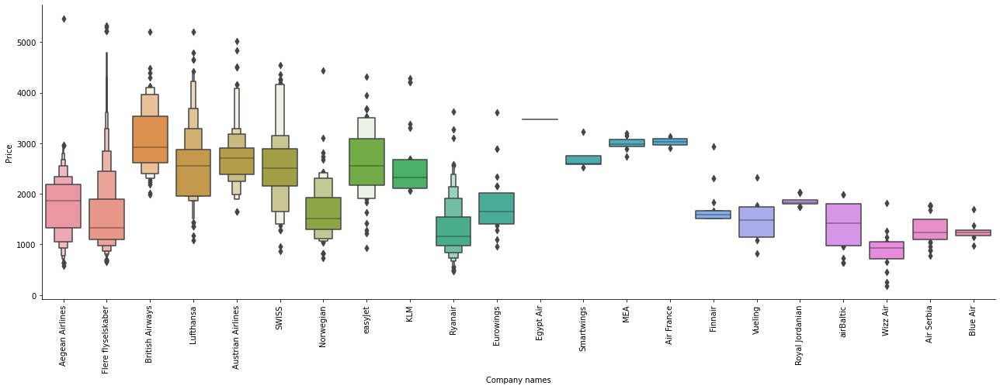

In [9]:
# From the catplot below we can see that Wizz Air is the cheapest, and also have the lowest median 
# British Airways have the highest median execpt for egypt air, but that is only one flight in comparison
# therefore we no not take Egypt Air into account

# Airline vs Price
df['Company names'] = df['Company names'].astype(str)

chart = sns.catplot(y = "Price", x = "Company names", data = df.sort_values("Price", ascending = False), kind="boxen", height = 6, aspect = 3)
chart.set_xticklabels(rotation=90)
plt.show()

In [10]:
#pd.set_option('display.max_colwidth', None)
df[df.Price == df.Price.min()]

,Destination,Out Date,Out Duration,Out Stops,Out Time,Company names,Price,Url,timestamp,temp Company names
1,63cy,2022-08-07,4t. 05min.,direkte,20:35–01:40+1,Wizz Air,187,https://kayak.dk/book/flight?code=SiCCUS-HO_.1...,20220506-2313,[Wizz Air]


In [11]:
df[df.Price == df.Price.max()]

,Destination,Out Date,Out Duration,Out Stops,Out Time,Company names,Price,Url,timestamp,temp Company names
26,63cy,2022-07-25,7t. 10min.,1 stop ATH,11:25–19:35,Aegean Airlines,5469,https://kayak.dk/book/flight?code=ShAilJe5f-.R...,20220506-2249,[Aegean Airlines]


In [12]:
import plotly.graph_objs as go
from plotly import tools

tester = df.groupby(['Out Date'],as_index=False)['Price'].min()
data = []
data.append(go.Scatter(x=tester["Out Date"], y=tester["Price"]))
layout = dict(
    title = "Cheapest flight price for each day in a month",
    xaxis = dict(title='Date'),
    yaxis=dict(title='Flight Price (kr.)'))

    

fig = go.Figure(
    data=data, layout=layout
)
fig.show()

### Distribution of flight prices to cypern in one month

In [13]:
import plotly.graph_objs as go
from plotly import tools

df_airline_airport= df.groupby(['Out Date','Company names'],as_index=False)["Price"].mean()

data=[]
for airline in df_airline_airport["Company names"].unique()[:5]: #For a more visual representation
#for airline in df_airline_airport["Company names"].unique():
    df_airline=df_airline_airport[df_airline_airport["Company names"]==airline]
    data.append(go.Scatter(x=df_airline["Out Date"], y=df_airline["Price"],name=airline))


layout = dict(
    title = "Average Flight Price Over Time by Airline from CPH to cypern",
    xaxis = dict(title='Date'),
    yaxis=dict(title='Flight Price (kr.)'))

    

fig = go.Figure(
    data=data, layout=layout
)
fig.show()

In [14]:
# plot distribution of all airline prices for Cypern over time

from datetime import datetime
df_filtered = df.filter(['Out Date','Company names','Price'])


def flight_prices_by_date(df_filtered):
    df_airline = df_filtered
    
    data=[]
   
    for date in df_airline["Out Date"].unique():
        df_date = df_airline[df_airline["Out Date"]==date]
        
        data.append(go.Box(y=df_date["Price"],x= df_date['Out Date'], name = date))
        
        
    layout =go.Layout(title='Distribution of Flight Prices from CPH to Cypern for all Airlines',boxmode='group',
                      xaxis= dict(tickangle=45,tickfont=dict(size=10)))
    
    fig=go.Figure(data=data,layout=layout)
    fig.show()

flight_prices_by_date(df_filtered)

In [15]:
# plot distribution of airline flight prices for Cypern over time

#df
from datetime import datetime
df_filtered = df.filter(['Out Date','Company names','Price'])


def flight_prices_by_company(df_filtered, company_name):
    df_airline = df_filtered[df_filtered["Company names"]== company_name]
    
    
    data=[]
  
    for date in df_airline["Out Date"].unique():
        df_date = df_airline[df_airline["Out Date"]==date]
        
        data.append(go.Box(y=df_date["Price"],x= df_date['Out Date'], name = date))
        
        
    layout =go.Layout(title='Distribution of Flight Prices by {} from CPH to Cypern'.format(company_name),boxmode='group',
                      xaxis= dict(tickangle=45,tickfont=dict(size=10)))
    
    fig=go.Figure(data=data,layout=layout)
    fig.show()
    


flight_prices_by_company(df_filtered, "Aegean Airlines")
flight_prices_by_company(df_filtered, "Lufthansa")
flight_prices_by_company(df_filtered, "British Airways")
#It's generally cheaper to fly august vs july

#### Defining popular departure days

In [16]:
df['Journey_day'] = pd.to_datetime(df['Out Date'],format='%Y/%m/%d').dt.day_name()#day_of_week
def is_journey_day_popular (row):
    popular_journey_days = ['Saturday','Friday']
    journey_day = row['Journey_day']
    if journey_day in popular_journey_days:
        return True
    else:
        return False
    
    return ''

try:      
    df['is_jorney_day_popular'] = df.apply(lambda row: is_journey_day_popular(row), axis=1)
except: 
    pass




In [17]:
# plot distribution of airline flight prices for Cypern over time (Popular vs unpopular flight days)

from datetime import datetime
df_filtered = df.filter(['Out Date','Company names','Price', 'is_jorney_day_popular'])

def flight_prices_by_company(df_filtered, company_name):
    df_airline = df_filtered[df_filtered["Company names"]== company_name]
    
    data=[]
    for is_journey_day_pop in df_airline["is_jorney_day_popular"].unique():
        df_is_flight_day_popular = df_airline[df_airline["is_jorney_day_popular"]==is_journey_day_pop]
        
        data.append(go.Box(y=df_is_flight_day_popular["Price"],x= df_is_flight_day_popular['is_jorney_day_popular'], name = str(is_journey_day_pop)))
        
        
    layout =go.Layout(title='Popular flight weekdays vs prices ({}) from CPH to Cypern'.format(company_name),boxmode='group',
                      xaxis= dict(tickangle=45,tickfont=dict(size=10)))
    
    fig=go.Figure(data=data,layout=layout)
    fig.show()
    


flight_prices_by_company(df_filtered, "Aegean Airlines")
flight_prices_by_company(df_filtered, "Lufthansa")
flight_prices_by_company(df_filtered, "British Airways")
#It's generally cheaper to fly august vs july

### Categorizing deptare times

In [18]:
#Parts of the Day
#Morning     5 am to 12 pm (noon)

#Early morning    5 to 8 am
#Late morning     11 am to 12pm
#Afternoon     12 pm to 5 pm

#Early afternoon   1 to 3pm
#Late afternoon    4 to 5pm

#Evening     5 pm to 9 pm
#Early evening   5 to 7 pm
#Night         9 pm to 4 am*
def time_category (row):
    time = row['Out Time'][:2]
    time = int(time)
    if ((time >= 5) and (time <= 8)):
        return 'Early morning'
    if ((time > 8) and (time < 11)):
        return 'Morning'
    if((time >= 11) and (time <= 12)):
        return 'Late Morning'
    if ((time >= 13) and (time <= 15)):
        return 'Early afternoon'
    if ((time > 15) and (time <= 17)):
        return 'Late afternoon'
    if ((time > 17) and (time <= 19)):
        return 'Early evening'
    if ((time > 19) and (time <= 22)):
        return 'Late evening'
        
    return 'Night'
        
df['part of the day'] = df.apply(lambda row: time_category(row), axis=1)
print(df.groupby('part of the day')['Price'].mean())
print('\nCounts\n',df['part of the day'].value_counts())


part of the day
Early afternoon    1936.845890
Early evening      1808.490654
Early morning      2007.593882
Late Morning       1740.163435
Late afternoon     1842.714286
Late evening       1563.170483
Morning            2060.322767
Night              1754.507937
Name: Price, dtype: float64

Counts
 Early morning      948
Late evening       393
Late Morning       361
Morning            347
Early afternoon    292
Late afternoon     273
Early evening      214
Night               63
Name: part of the day, dtype: int64


### Barchart showing which part of the day it is cheapest to fly in

<AxesSubplot:ylabel='part of the day'>

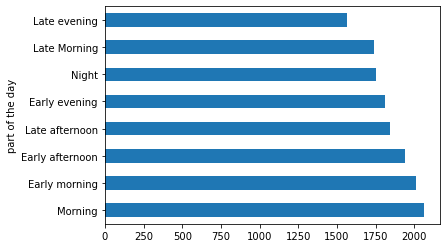

In [19]:
df.groupby('part of the day')['Price'].mean().sort_values(ascending=False).plot(kind='barh')

### Categorizing popular vs unpopular flight days

#### How does the departure weekday affect the price?

<AxesSubplot:ylabel='Journey_day'>

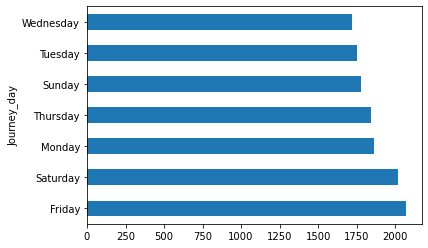

In [20]:
df.groupby('Journey_day')['Price'].mean().sort_values(ascending=False).plot(kind='barh')

##### Which day does most flights fly to Cypern?

<AxesSubplot:>

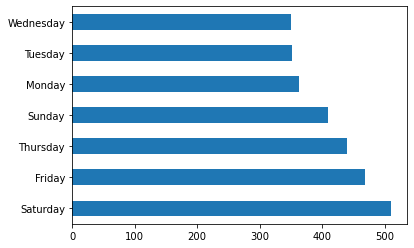

In [21]:

df['Journey_day'].value_counts().sort_values(ascending=False).plot(kind='barh')

### How does the amount of stops affect the price?

1    1414
2    1312
3     158
0       7
Name: Out Stops number, dtype: int64

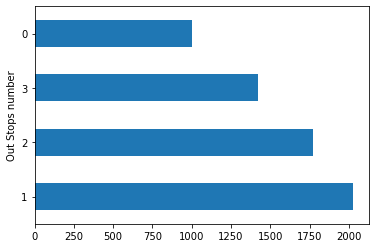

In [22]:
#direkte = 0, 1 stop = 1, 2 stop = 2
#search(substring, fullstring)
#Only 7 flights in august is 0 stops
from re import search

def stop_category (row):
    if search('direkte',row['Out Stops']):
        return 0
    if (row['Out Stops'] != 'direkte'):
        return row['Out Stops'][:1]

df['Out Stops number'] = df.apply(lambda row: stop_category(row), axis=1)
#df.groupby('Out Stops number')['Price'].mean()
df.groupby('Out Stops number')['Price'].mean().sort_values(ascending=False).plot(kind='barh')
df['Out Stops number'].value_counts()

### Cleaning data before heatmap

In [23]:
df['Out Stops number'] = pd.to_numeric(df['Out Stops number'])
for i, l in enumerate(df['Out Stops number']):
    print(type(l))
    break

<class 'int'>


In [24]:
label = LabelEncoder()
df['Journey_day_number'] = label.fit_transform(df['Journey_day'])

#### Converting duration to float number

In [25]:
#Converting Duration to a float
import re
#if cell has been run before nothing will happen (cannot replace characters in float)
try:
    df['Out Duration'] = [x.replace('t','').replace('.','').replace('m','').replace('i','').replace('n','').replace(' ','').replace(',','') for x in df['Out Duration']]
except:
    pass
def add_comma (row):
    out_duration = row['Out Duration']
    out_duration_list = list(out_duration)
    out_duration_list.insert(-2,',')
    out_duration_minutes = int(out_duration[-2:])#last 2 characters 
    out_duration_list_as_string = ''.join(out_duration_list)
    out_duration_minutes = out_duration_minutes / 60 * 100
    new_value = ""
    
    if len(out_duration_list) >= 5:
        new_value = out_duration_list_as_string[:3] + str(int("{:.0f}".format(out_duration_minutes)))
    else:
        new_value = out_duration_list_as_string[:2] + str(int("{:.0f}".format(out_duration_minutes)))
    
    return float(new_value.replace(',','.'))

#if cell has been run before nothing will happen (cannot replace characters in float)
try:      
    df['Out Duration'] = df.apply(lambda row: add_comma(row), axis=1)
except: 
    pass

for i, l in enumerate(df['Out Duration']):
    print(type(l))
    break

<class 'float'>


#### comparing with another dataset before heatmap

In [26]:
filename = "airline.csv"
df_rating = pd.read_csv(filename)
df_rating.airline_name.str.replace('(egyptair)', 'egypt-air')
df_rating.head()

uniqueAirlines = df['Company names'].unique()
df['Company names'] = [x.replace(" ","-").lower() for x in df['Company names']]

df['Company names'].mask(df['Company names'].str.contains('klm'), 'klm-royal-dutch-airlines', inplace=True)
df['Company names'].mask(df['Company names'].str.contains('swiss'), 'swiss-international-air-lines', inplace=True)
df['Company names'].mask(df['Company names'].str.contains('mea'), 'mea-middle-east-airlines', inplace=True)
df['Company names'].mask(df['Company names'].str.contains('vueling'), 'vueling-airlines', inplace=True)
df['Company names'].mask(df['Company names'].str.contains('royal-jordanian'), 'royal-jordanian-airlines', inplace=True)
df['Company names'].mask(df['Company names'].str.contains('royal-jordanian'), 'royal-jordanian-airlines', inplace=True)
df['Company names'].mask(df['Company names'].str.contains('egypt-air'), 'egyptair', inplace=True)

gennemsnit = df_rating.groupby('airline_name')['overall_rating'].mean().apply(float).to_dict()
gennemsnit
gennemsnit['lufthansa']

def add_rating (row):
    NaN = float("NaN")
    airline_name = row['Company names']
    if(airline_name == 'flere-flyselskaber'):
        return NaN
    else:
        return gennemsnit[airline_name]
            
df['rating'] = df.apply(lambda row: add_rating(row), axis=1)
df.head(2)

/var/folders/d5/029s43s93fq8y41q591jyp1c0000gn/T/ipykernel_73750/527594771.py:3: FutureWarning:

The default value of regex will change from True to False in a future version.



,Destination,Out Date,Out Duration,Out Stops,Out Time,Company names,Price,Url,timestamp,temp Company names,Journey_day,is_jorney_day_popular,part of the day,Out Stops number,Journey_day_number,rating
26,63cy,2022-07-25,7.17,1 stop ATH,11:25–19:35,aegean-airlines,5469,https://kayak.dk/book/flight?code=ShAilJe5f-.R...,20220506-2249,[Aegean Airlines],Monday,False,Late Morning,1,1,7.823789
75,63cy,2022-07-16,9.42,"2 stop FRA, ATH",14:55–01:20+1,flere-flyselskaber,5330,https://kayak.dk/book/flight?code=SfCiIAnLeo.f...,20220506-2157,"[SAS, Aegean Airlines]",Saturday,True,Early afternoon,2,2,NaN


### Heatmap 

<AxesSubplot:>

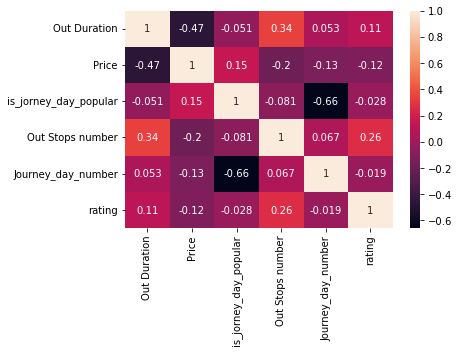

In [27]:
#TODO: column values to numeric: 
#part of the day kategoriseres = [1,2,3,4,5,6] (evt opdele til færre kategorier)
#out stops = [0,1,2,3]
#weekday / weekend --> [1,2]
sns.heatmap(df.corr(), annot=True)

#### comparing with another dataset

#### Showing graph of average price and rating

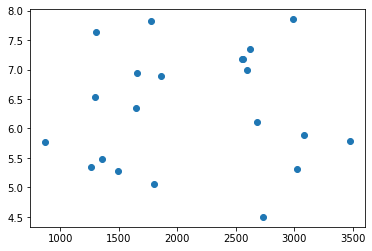

In [56]:
import matplotlib.pyplot as plt

#df.groupby('Company names')['Price'].mean().sort_values(ascending=False).plot(kind='barh')
#mean price per flyselskab. mean rating per flyselskab
#plt.plot(df.groupby('Company names')['Price'].mean(),df.groupby('Company names')['rating'].mean())
plt.scatter(df.groupby('Company names')['Price'].mean(),df.groupby('Company names')['rating'].mean())
plt.show()

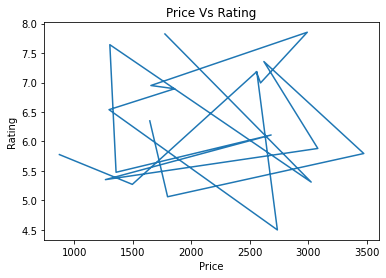

In [57]:
plt.plot(df.groupby('Company names')['Price'].mean(),df.groupby('Company names')['rating'].mean())
plt.title('Price Vs Rating')
plt.xlabel('Price')
plt.ylabel('Rating')
plt.show()

## Cleaning content column

In [90]:
label = LabelEncoder()
df_rating['sentiment'] = label.fit_transform(df_rating['sentiment'])

/Users/mathiaspoulsen/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='sentiment', ylabel='count'>

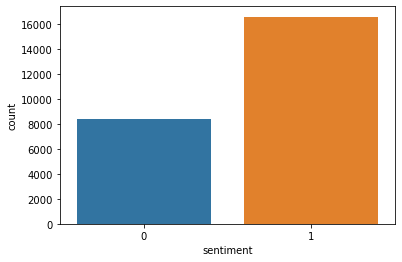

In [91]:
#Fordeling af positive og negative kommenatrer
#negativ = 0, positiv = 1
#df_rating['sentiment'].value_counts()
df_rating = df_rating.dropna(subset=['overall_rating'])
df_rating = df_rating.dropna(subset=['sentiment'])

sns.countplot(df_rating['sentiment'])

#### Getting the words root form

In [92]:
#Remove all special and numeric character from data and also remove stopwards an apply stemming
nltk.download('omw-1.4')
import nltk
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
lemmatizer=WordNetLemmatizer()

nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

ps = PorterStemmer()

stop_words = stopwords.words('english')
print(stop_words)
lemmatizer=WordNetLemmatizer()
for index,row in df_rating.iterrows():
    filter_sentence = []
    sentence = row['content'].lower()
    sentence = re.sub("[^a-zA-Z]"," ", sentence)#cleaning
    words = nltk.word_tokenize(sentence)#tokenization
    words = [w for w in words if not w in stop_words] #stopwords removal
    for word in words:
        filter_sentence.append(lemmatizer.lemmatize(word))
    
    filter_sentence = " ".join(filter_sentence)
    df_rating.loc[index,'content'] = filter_sentence
    print(filter_sentence)
    print('')
    print('')
    

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/mathiaspoulsen/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/mathiaspoulsen/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/mathiaspoulsen/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/mathiaspoulsen/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

flying aegean since took olympic slot heathrow year morning october th heathrow fog bound flight athens delayed two hour meant missing evening flight mykonos soon checking staff helpful arriving athens put hotel sofitel everything paid caught flight mykonos following morning thought evening flight mykonos tight london flight around hour need looking aegean excellent airline part holiday flew crete well flight full look forward flying next october


flew business class club condor jfk feb returned feb great experience airbus clean comfortable flight left time crew first rate great bargain highly recommend


two flight first ei dub bcn ei pmi dub first took late due late arrival aircraft truth refreshingly aircraft arrived min due depart time made fairly quick two hour flight bcn full flight space move usual cabin baggage issue took cabin crew get going inflight service everything asked crew nice little robotic plane spotless hurry go understandable filthy either flight back packed airpo

flew agp dub ei paid bit extra sit business class sure comfortable lying angle long period time worth entertainment screen pretty difficult see shade left ei maybe roll business lite route throw free something mix really quite short flight hugely important might nice touch bought breakfast quite nice filling crew usual brand ei pleasant usual happened landing happened last time almost like someone peek window wonder plane surprise waited age get stand even though multiple empty equally long land bridge another min luggage fine air ground need work recommend rush landing


flew business class ireland vacation say best flight thought would aer lingus business class seating get worth value area service crew great always seeing needed something ok keeping updated


travelled lgw yyz business class first trip aer lingus long haul sure expect experience perfect business cabin seat plenty room storage neighbour making feel well isolated quiet flight sleeping comfortable although fully flat be

bangalore sharjah despite leaving ungodly hour case probably one favourite low cost carrier opinion better full service airline fly middle east india plane clean service excellent plane half empty whole row sleep since leaving early morning light switched early overall happy service air arabia provides


lhr ath lhr clean new airbus aircraft seat perfect good legroom compensates selection nice music take help fall good travelling mode flight ahead schedule scared flying smiling helpful flight attendant attitude definitely helped sweet take small nice touch decent proper meal honest wine actually tasted good overall good airline helped begin holiday hour reaching greece prolonged hour leaving


heathrow larnaca return aircraft clean tidy departed arrived time way good food inflight entertainment free drink great service friendly crew booked well advance got great price good airline


flight bariloche buenos aire delayed hour weather connection ba iguazu missed despite airline staff bari

bangkok moscow simferopol flight departed arrived time crew professional reasonable friendly level english adequate hand held entertainment system bangkok moscow rather dated substandard business class cabin entertainment shorter moscow simferopol sector bangkok moscow cabin almost full service standard maintained food good moscow simferopol cabin crew served good meal short flight


flew four separate leg within myanmar found surprisingly good normally expect catering flight hour something segment arrived good time heho airport flight yangon automatically put earlier departure certain amount third world amateurism boarding process seemed work


recently flew throughout myanmar following route yangon mandalay heho mandalay nyaung u bagan heho thandwe yangon fokker atr aircraft check interesting computer everything weighed manually ground crew cordial overly friendly flight crew friendly always helpful catering good short flight croissant drink offered even shortest flight unthinkable e

berlin madeira berlin friendly crew flight including regular update flight status compared germanwings passenger still get free drink round alcoholic beverage included rather tasty sandwich chocolate later space also ok service declined year free magazine air berlin still offer better service charter carrier plus friendly staff made flight enjoyable thing would criticise although show even movie flight need purchase headset end nobody yes euro giving free would nice


hour flight almaty bangkok month comfortable cabin crew friendly helpful without overbearing spacing row seat large seat reclined quite far back even though indivdual tv screen seat given ipads preloaded movie brilliant idea huge choice movie recent blockbuster release along international movie overall pleasant flight would definitely choose fly air astana


dushanbe almaty business class western standard experience including attentive friendly cabin crew excellent food time departure arrival short trip relaxing moment bu

omsk moscow st petersburg small problem check omsk received one boarding pa breakfast good service leisurely hr plus flight plane full flight left landed time surprised english language paper board improvement previous internal flight moscow st petersburg short min flight received quick light second breakfast adequate flight flight left landed time


svo bkk business class quite surprised flight attendant lady cool friendly food good even though low calorie pre order meal plane without individual ife received portable movie player decent selection overall board experience great airport experience business lounge sheremetyevo airport awful plastic fork almost food available c aeroflot business class good value money


ab ord txl ab txl ord privilege flying air berlin business class last week berlin ord first time air berlin seating best staff friendly efficient return berlin ord best airline meal began thai beef salad selected beef slice water chestnut sauce entree salad entree tender b

way toronto beijing told hot water beverage due contamination issue flight staff friendly way home forced downgrade ticket first class coach child coach policy husband sat last row first class kid first row coach first class row literally right front row child sat absolutely issue leg china kid sitting coach never told policy way back ticketing agent refused issue ticket tried upgrading kid refused second leg trip first class seat available however second leg trip economy seat flight desk agent made u wait hour refusing give back passport said way could fly downgraded ticket economy class seat agent refused allow keep first class seat whole situation beyond logic


transit tegel airport double security check arrival departure one hour transit enough almost make flight tlv tegel tegel zurich luggage arrive wait hour next air berlin flight receive luggage cheap worth


th time week delayed edinburgh shannon route operated aer arann case blamed technical difficulty aircraft ageing atr tur

booked air canada via united website idea flight leg montreal rome rouge identified communication never heard rouge pay discounted price experience horrible hard uncomfortable seat entertainment international flight unheard day age ran food selection left hardly edible worst part plane smelling urine minute one entered cabin never


vancouver toronto ac toronto baltimore ac returned wonderful trip alaska flew alaska air returned air canada flight big mistake booked last october confirmed reservation moment arrived airport problem first carry size smaller airline ok repacked paid extra checked bag proceeded get boarding pa find standby reasonable explanation offered proceeded gate stood ready first line gate agent patronizing condescending best finally told fault since select seat booked system said could select seat would get later travelled world business rookie waited get seat asked people check carry bag free since flight full assured checked final destination first leg completed co

dus auh booked flight opodo listed etihad flight flown etihad number time always satisfied looking forward experience later stage purchasing flight part trip australia listed operated air berlin considerably bad experience flight dus mia two year ago excited wanted give air berlin another try long haul flight sadly thing turned even worse expected plane old entertainment system installed leg room would ok trip pmi germany hour trip ridiculous flight attendant rather bossy food awful doubt c actually working u climate cabin integral part success flight hardly oxygen make every flight unpleasant experience altogether poor experience might state art back early ninety talking ryanair etihad agreed codeshare air berlin like booking four star hotel staying two star room


dub jfk return economy time comfy enough nice course meal movie snack small breakfast landing avod really good nice selection movie cabin crew friendly efficient helpful pre immigration clearance dublin airport fast save lo

ac yyz sxm jan ac sxm yyz feb read review prepared worst worse worst yes one paid pod yyz sxm year advance rouged lack refund business class airfare difference moot compared horrific service felt like airplane child playing flight attendant sloppy attire stroppy attitude respect ridiculous service let even talk antiquated offering ipad like air canada proper booking future flight avoid red check mark indicating flight operated rouge west jet earned new client yearly trip anguilla via sxm


recently flew honolulu vancouver red eye chose red eye unless flew alberta choice easily worst flight husband issue noted previous review existed cramped seat old show movie minimal cabin service inconsistent temperature aisle space must barely meet standard reading light working quote attendant working reading light airline safety requirement response got finally tracked attendant initially said would check light working get mobile reading light never got back decided use remaining aeroplan mile non

cph txl dus zrh new clean aircraft snack served crew friendly even though spoke english fare cheap compared competition german magazine newspaper available would fly europe


txl krk krk dus impressed airline good web site discovering service making purchase reasonable pricing meaning one piece together complex itinerary without requiring round trip get best price time performance leg flew baggage appearing promptly flight onboard experience similar txl krk krk dus flight former latter luxurious newish interior good service


ac december toronto phoenix arizona normally enjoy flying air canada even tango preferred airline air canada rouge least comfortable airline ever sit perfectly straight knee touched back seat front boyfriend quite bit larger space provided poor person front u issue reclining knee seat air canada great long rouge tacked end


e flew vancouver kahului air canada rouge ac back ac week ago ala might last time use airline uncomfortable seating rudest crew back still hu

booked trip ottawa san diego united airline flight chicago ottawa got cancelled due weather condition accepted alternate route air canada regret airplane sat yow tarmac hour flight attendant could say lightening storm toronto good thing say turned engine allowed u get seat waited way plane tor one able provide assistance ensure could make connecting flight san diego showing time flight board passing custom baggage check etc flight longer showing flight board ac flight attendant found roaming around clue direct happen find service desk told get line even though said flight leaving minute simply needed gate number people line flight left time received service booking another flight get san diego opted layover los angeles night instead waiting another hour toronto offered compensation either spending night toronto los angeles even though air canada caused miss flight staff member told could give boarding pa next day flight omitted say complete booking expected go ac ticket counter lax get

purchased ticket october mayan riviera trip feb paid extra room seat picked ticket week ahead time checking ticket found seat taken away explanation lost seat put cattle car section told like could cancel senior told checked ahead see change made guess try fly different airline


seat narrow hard taller ft knee jammed row front unreal entertainment tv nothing hour flight class act flying ac year never knew rouge rd rate flight best avoid cost


first experience air canada rouge never use far worst flight experience ever cabin extremely cramped knee stuck back passenger front entire flight check girl treat either new low air canada


half price almost travelling return athens greece sydney australia really complain difference found emirate singapore etihad spirit drink economy class cold beverage room temp ice mini toothpaste toothbrush bad entertainment system take min find movie option tab button navigate positive travelled safely time staff smiled clean toilet staff cleaned toilet ev

flew toronto yesterday flight vega scheduled arrive around vega time took minute late flight uneventful first hour exception worst possible seat providing comfort space ask lady front keep seatback straight prevent injury knee pilot came intercom tell u situation whereby lost left engine diverting denver get checked assured u could fly safely one engine good job getting u ground without incident local time met firetrucks tarmac checked engine determined ok proceed gate got sit plane extended period without air conditioning little information forthcoming situation finally told another plane would dispatched toronto pick u get way vega local time finally got plane gave everyone worth meal voucher waiting began went gate plenty time lot kill representative gate checked departure schedule discovered time delayed suddenly departure time changed long take get toronto denver even considering new crew needed changing gate told announcement plane ground would gate finally thing looking started 

air canada rouge great cabin crew terrible seating space flew toronto canada varadero cuba back direction cabin crew excellent good rouge stop matter great people solve issue lack space seat airplane type raw seat basically mean leg room anyone close foot cm avoid rouge flight seating pitch plane flight caribbean hour flight able get seat pain back leg tight seat view security issue since case emergency people extreme difficulty quickly leave seat come entertainment system something called wifi paid work say worth option come food drink non alcoholic beverage including coffee tea free ever quantity limited one lucky two drink best food liqueur purchased need credit card cash accepted


yyz lhr yyz flight arrived time cabin crew friendly good flight entertainment system food ok check staff really good price better air transat short air canada staff seem ditched bad union attitude combined flight yeg fll winning back


flew yyc yeg yow yqb yyz yyc outbound trip awful flight full kid loud

got switched rouge barbados toronto hour flight without warning lack entertainment issue prefer read seat size quite small acceptable long flight complaint caribbean considered international therefore meal served purchased meal unpalatable senior travelled air canada tca life definitely looking alternative


people book air canada flight pay full price told flying rouge choice decline seat uncomfortable tv plane really looked decrepid flight attendant seemed extension whole sad situation flown air canada since always proud canadian airline find shame longer compete fine airline world unless extreme emergency never fly air canada


air canada rouge flight venice toronto may plane tv customer expected download air canada app advance smart phone pad etc rent ipads without stewardess spent much trip trying trouble shoot problem access system people gave spent hour nothing watch make long flight make assumption everyone travelling mobile device want watch tv phone screen good customer servi

smooth check madrid airport boarding fast problem although full flight nice crew excellent catering plastic tableware average seat comfort cdg pvg experience ife outdated poor screen movie selection arrival priority baggage last arrive wrong belt overall good experience


wife flew barbados toronto ac rouge saw red booked air canada regular service switched rouge without consent seat uncomfortable limited leg room crammed audio usb electrical plug iphone ipad download ac rouge apps see movie listen tune flying hour sitting seat killed back bored extra cash flying westjet ac rouge would fine short flight eg ottawa toronto


flew yyz sjo longest hr ever flown sjo time worst flight crew nice make cramped leg room uncomfortable seat luckily ipads could use onboard entertainment system return flight even worse sat gate hour boarding information told leave gate new flight coming would departing minute turned minute waited long hour wind change direction could take apparently plane rouge send

la yyz march loyal air canada flyer mostly travel executive class extremely disappointed rouge air canada forcing client use rouge stopped regular air canada flight usual destination plane old rickety attendant inexperienced although friendly would different fare dropped half exactly ridiculous looking alternative forced receive second class service high price entertainment system poor show movie old tube screen provide ancient headphone adapter point


came back trip orlando toronto purchased ticket air canada find week got rouged air canada altitude elite k member fly mainline ac quite frequently bought ticket april expected fly airline originally booked case switched flight without warning getting plane first thing notice squeezed seat together give leg room unless young child knee plastered seat back front good luck inflight non entertainment system need remember charge device completely outlet also movie second rate best luck trying get work done cramped room allow regular sized l

ai th december arrival fra discovered could use lh business lounge arrived terminal used brand new lounge couple hour hr layover took trek terminal b popped lounge hour similar layout food reception staff pleasant lh lounge pleasant enough good selection drink food best minimal quite uninteresting wifi good easy connect quick enough video skype b lounge right next gate really minute walk call though monitor show boarding time careful strolled gate find last board greeted politely crew issued new boarding card shown seat taken interloper swiftly moved sat made comfortable choice drink presented along hot towel eye mask crew really nice mix age pleasant courteous helpful cabin cor leaf awful lot desired seat spacious comfortable garish picture definitely easy eye sooner levelled crew came round offering pre dinner drink shortly time dinner late flight flight crew arrived cotton tablecloth served either chicken shashlik prawn curry served usual naan rice vegetable vegetarian option also a

air india need get back basic retrain staff miserable bunch flown three time one good thing say flight last flight last travelled mumbai delhi singapore said left arrived time decided fitting end stay india would spend couple day taj hotel mumbai done two year magic end india journey end endure air india flight left nasty taste mouth


dubai goa worst aircraft travelled dirty scruffy broken part air india national airline inflight entertainment poor food poor flight attendant abysmal third world airline


bit apprehensive boarding read bad review air india must say flight mumbai delhi october ai good time flight attendant really friendly worked hard breakfast one best ever many year travelling check staff friendly gave companion big smile would travel time much better many european airline good asian one


hearing horror story air india recent trip proved true travelled shj cok ai st november ai used year old vt esh pealed panel rattling window make journey worse water toilet cabin cre

lhr sfo change cdg lhr cdg flight short one enough give overall good impression flight lasted le hour offered drink pastry breakfast staff friendly cabin clean flight cdg sfo brilliant satisfied entire flight seat comfortable flight attendant friendly attentive began taxi runway personal video screen changed standard screen show live camera cockpit video screen really good grid picture clear sound also worked well control responsive really good selection impressed food usually pre order special meal decided chance standard meal chicken sauce main course couscous got nice roll good sized wedge packaged brie large thick slice packaged pineapple really tasty good sized chunk brownie dessert hour landing got second meal got piece seasoned chicken potato sauce lemon tart dessert along another bread roll package cream cheese entire flight enjoyable plane comfortable clean staff friendly polite spoke fluent english announcement cockpit clear captain gave little update throughout flight would 

travelled work de luxe gold coast auckland returned flight nz done trip many occasion never disappointed air new zealand crew friendly make feel welcome due ex tropical cyclone marcia return flight diverted brisbane bussed gold coast airport done efficiently without fuss like short flight across ditch ever sit seat complaint make whatsoever


delhi varanasi return superb flight time spacious seating efficient fa delicious meal given plane full fa serving impressed great experience overall


goa bom time departure arrival clean aircraft light snack served min flight ife good great legroom checked bag carousel time reached terminal gate


flew brisbane vancouver via auckland nz outbound return nz inbound chose air nz based recommendation rating boy disappointed aircraft exception nz seriously need refurbishing seat hard cramped long haul travel ife terrible picture quality poor say least inflight magazine took time patience navigate experienced traveller one could say food bad get want w

flew club class air transat lgw yyz although call club actuality premium economy impressed seat comfortable food plentiful tasty flight attendant friendly welcoming great selection movie tv show demand good sized screen


fight lax ppt full day u flight rdu msp lax quite exhausted couple flight late older plane packed hoping change pace hour flight lax ppt disappointed impeccable coach seat roomy flight staff extremely friendly brand new inflight entertainment system think entire cabin recently redone experience got first trip french polynesia great start yeah still tough sleep coach seat great experience made bearable course nothing like waking good french breakfast landing tahiti anticipation luxurious vacation ahead really option flying tahiti care air tahiti nui rocked


flew economy round trip los angeles papeete flight time nice aircraft economy seating good inflight service excellent although aircraft return flight got aircraft reconfigured new seat touch screen video quite nice

bangkok dmk siem reap cambodia november first time air asia arrived late plane turned around quicker normal gate agent never said anything delay hate say flight late departed minute late arrived siem reap minute late short minute flight plenty leg room cm seat middle open plenty room flight attendant friendly eat drink snack looked reasonably priced luggage quickly immigration took forever air asia fault nice airline flew couple day later


flew th july th august first flight london calgary really good issue air transat staff london gatwick airport nice helped lot crew flight pretty much nice helpful end flight crew helped get bag overhead compartment without asking professional flight back different story staff calgary airport helpful good flight new cabin excellent flaw tilt screen person front fully reclined screen mind system randomly think touched need fix happened flight different aircraft


flew direct vancouver paris back excellent experience around air transat delivered great 

london toronto recently return flight child first time air transat user always travelled british airway impressed service onboard quality food despite low cost airline definitely use airline


fly edmonton dominican republic march arrived airport check hr boarding time find flight going delayed hr morning progressed delay lengthened tried find information staff counter helpful told call customer service rude lady answer call actually hung u sent email customer relation email never replied finally boarded plane almost hr delayed upon returning home emailed transat received email week stating fine print basically mean responsible anything food voucher would given credit towards next vacation lousy customer service lousy contact


flew may nd vancouver manchester really pleased airline staff paid lot past received good service personal tv screen froze halfway flight use really bother went sleep one else seemed experiencing problem flying back may rd dog going worrying part hopefully every

kununurra broome erj pleasant flight seat pitch light refreshment fine short leg seat comfortable adjustable headrest service friendly flight departed arrived minute early


sure people expecting flying low cost airline trip bali singapore great maybe average expectation booking helped made point reading fine print air asia website saved money pre booking luggage seat first row plane also happy paid meet greet option long check queue air asia flight departing early queue right front assisted passport control led business lounge lounge pretty poor air asia fault crew young polite efficient well done air asia


chennai singapore stopover kuala lumpur journey great even though flight chennai delayed half hour seat comfy liked airline hospitality cost thank airasia wonderful journey


nd trip air transat time flew vancouver london september returning october economy class outbound refurbished plane return trip tired version trip staff pleasant service good check arrival large person defini


alaska airline choice mci sea anc flight generally good time new sky interior slimline recaro seat bit uncomfortable landing anchorage pilot apparently took wrong taxiway misjudged turn braked halt squeal brake hard stop used reverse thruster turn plane completely around anc sea mci late flight anc substituted smaller plane put u non recline seat satisfied alaska continue use somewhat minor issue tend found airline


flew alaska non stop dallas portland first class crew friendly attentive everyone need hour delay boarding aircraft dallas crew kept everybody informed kept serving drink small snack u impressed first class service


recently flew alaska airline longer leg tus sea anc pdx first class flight along segment flight flight crew fine complaint defines first class alaska airline tus sea meal consisted chicken sandwich chocolate mint inflight entertainment device provided anc pdx segment alaska time pdx time wake breakfast meant zero food provided flight attendant asked wanted an

flew seattle la vega connection portland direct flight would meant hanging around long live uk nervous flight would delayed given negative review everything went smoothly right time impressed complimentary drink service given similar budget airline uk charge drink return flight direct seattle time found baggage check quick friendly exception one rather curt stewardess everyone else absolutely fine


flew naples london rt never use airline disorganized check particularly clean plane terrible seat even worse usual bad airline seat


returned rome toronto never travelled extensively many different airline worst seen aircraft old dated old video screen spread far apart see wanted watch spider man hour flight served tiny dried pasta dish glass house wine individual bottle like next service hour later tiny dry muffin little bag cracker dinner water service throughout flight aircraft smelt wash room filthy guy next table tray cracked two seat permanent recline position check online bear mob c

atl sea first class lamb dinner good service excellent new version digiplayer entertainment system big improvement left time arrived little early seat comfortable ask much


evening flight lengthy unexplained delay direction great inconvenience employee unconcerned witnessed one woman charged additional large carry bag minute later employee helped another woman squeeze carry bag holder charge additional fee charged fee explained reservation process seat recline uncomfortable lower price equate lower service


better ground crew flight crew professional plane time flight round trip fly allegiant


booked avoid hour drive myrtle beach counting drive airport took hour allegiant terrible airline huntington airport gave rating zero option


caught connecting flight alitalia paris rome old plane luckily short flight flew alitalia rome ny long hr disappointing flight tv monitor work staff seem care even numerous complaint food horrible awful lasagne chicken serving staff disappeared remainder

set travel vega dallas orlando gatwick nightmare started first flight flight delayed due cabin crew late got dallas missed connection due previous flight delay get told go next flight fully booked would put standby made aware connection get cared le partner explaining needed get home due commitment etc put u direct flight booked told u heathrow airport min car gatwick advised airline would pay bus journey took arrived heathrow nightmare continued american airline lost luggage realised luggage missing went help desk file report told go home luggage arrive later day ok well home day numerous phone call american airline helpful u


allegiant airline exactly thought would cheap direct flight frill efficiently effectively got point point b worried read review people come sight like negative thing say say anything extremely negative sure seat recline comfortable given free snack drink knew going definitely fly allegiant great value


april south bend indiana punta gorda fl extra charge absol

flight toronto rome connecting rome milan flight late leaving toronto minute actually hour time left runway flight crew inattentive somewhat rude appeared serving drink meal disappeared remainder flight passenger go get drink service completed lot spill passenger walked back plane drink continental breakfast pathetic offering oreo cooky along yoghurt soggy pastry inside cellophane wrapper landed fast tracking provided u passport control half hour get connecting flight surprise missed connection terminal issued another boarding pa wait another hour next flight flight late leaving never fly alitalia service unreliable flight crew indifferent washroom facility flight deplorable


two couple traveled heathrow palm spring via dallas fort worth heathrow flight time service ok great little matter fact use term flight dfw different affair book seat advised ask desk dallas arrived impressed knew coming added think four seat spare leave u already trouble booking seat heathrow wanting pay extra p

nh singapore tokyo haneda june thoroughly enjoyed onboard experience cabin pristine well maintained flight attendant journey temperature comfortable toilet clean cabin crew top notch quickly identified special meal onboard passenger kept hydrated regular service beverage cabin crew attentive best passenger throughout flight despite reading review uncomfortable seat aircraft found comfort seat served well enough enable sufficient rest think twice flying ana nippon airway


read review bit worried booked flight honolulu left april th time allegiant rep flight attendant nice seat bit tight give free peanut drink since saved nearly dollar per person could overlook flight back time flight attendant nice people staff check u


great flight today first time flying allegiant felt bit gamble read poor review flight today clearwater harrisburg pa perfect check person pilot flight attendant truly noticed attention customer service expecting little thing like friendly talking u like human robot ma

awful experience cabin crew amongst rudest least helpful people likely come across life travelling two small child year month spent majority flight foot rocking mth old sleep finally fell asleep breakfast arrived unfortunately knocked tray onto floor member cabin crew stepped ignoring apologised asked help pick curtly said would get later breakfast strewn floor front toilet sleeping baby arm another passenger woke half hour later fellow passenger kind enough pick item


lax han previously flew route economy class found ana service class comparable business first class airline disappointed business class experience ana service quite outstanding attention paid every little thing cleaning toilet use offering beverage food moment one eye flutter open sleep entertainment system offered full compliment hollywood japanese international film along music television show mostly japanese game since red eye flight meal simple amuse delicious although husband eat far exotic along breakfast meal lan

boarding pa printed dfw airport showed flight dfw tyr originally scheduled pm delayed pm still went gate see delay changed monitor showed flight delayed pm returned gate pm told flight left flight dfw tyr afterwards assistant checked u flight next day requested whether voucher hotel told called customer service blamed listening announcement rent car return home drove back dfw next day return rental car person trying shift responsibility away somebody else made profit charging passenger providing le service whats celebrate


flew nh iad nrt seat existing st seat satisfactory though control worn dated always nh service excellent pyjama course japanese western meal excellent alcohol selection fa always seemed keep eye passenger needing anything attention every detail impressive ife needed updating strongly recommend ana


opportunity fly dreamliner frankfurt tokyo haneda november first impression cabin wonderful spacious mention huge window ana installed seat recline bother passenger behi



singapore tokyo sapporo return first flown b special livery back b b first last flight sat behind business class seating okay inflight entertainment good food delicious magazine japanese english


hong kong tokyo narita fairly new b sat row economy class row ana separated main economy section cabin quiet meal good average wide range movie selection cabin crew attentive polite generally good comfortable flight


currently sitting lax airport worst experience airline arrived la morning qantas perth sydney upon going express connection informed one ground crew member would required take luggage check inside terminal arrived terminal sent american airline employee different place try drop baggage finally arrived last spot min prior flight schedule time informed able check bag take cabin despite checked line prior going airport put wife stand list flight hour later checked bag placed second list moment according front desk lady one world sapphire member would put front people similar situ

travelled asky douala bangui asked see bag prior loaded verify actually able see bag however arrived bangui found loaded along passenger baggage told flight full baggage offloaded due weight despite numerous phone call email still received bag asky agent shown interest whatsoever arrived bangui clothing flight booked ethiopian airline claim partner ethiopian said help asky receive bag would recommend airline anyone arrogant customer service


traveled barcelona ny flight paid believed extra legroom seat seat cramped boarded last space nearby bin hand luggage plane ancient even individual air control aa state booked preferred seat merely allowed u choose seat


ghastly flight first class aa pvg lax flight attendant nice seat horrible uncomfortable really poor leather padding weird need press latch arm seat first order operate seat control bed sleep position seat bulging ridge middle hinge made impossible lie privacy seat enclosure partial wall wide open light noise smell cabin omniprese

vie jfk business class immaculate cabin comfortable seat lie flat fantastic screen vod selection movie tv show limited offered champagne juice austrian cocktail menu distributed board chef took order lunch takeoff delayed minute without explanation takeoff hot towel distributed followed excellent lunch service appetizer trolley followed soup excellent entree great selection dessert followed selection individually prepared coffee arrival second excellent meal wonderful wine selection nicely poured service attentive without much smile ironically austrian motto fly smile notably bathroom kept immaculate throughout entire flight overall superb inflight service best catering airline


round trip fra icn first day may time boeing mixed conf plane cabin crew kind professional food excellent complaint would avod little old model needed press hard otherwise missed repeatedly touch though large selection date movie could compensate altogether gathered best long haul flight experience definitely 

azul become first choice brazilian domestic flight new embraer erj erj personal entertainment leather seat comfortable good space take free soft drink snack available crew outstanding


sdu vcp embraer azul brought brazilian market item domestic airline long forg tten good seat reasonable legroom individual ife satellite tv courteous efficient service new fleet embraer e jet plus


syd icn return second time flying time business trip priority boarding business class passenger flight attendant attentively directed seat visible throughout entire flight check passenger serve drink food served three course meal korean western option highlight quality selection wine offer business passenger best experienced flight seat comfortable wide however lie flat though reclined enough sleep well flight entertainment good flight shopping breeze


sea icn july th icn sgn july th third time flying asiana flight crew polite entertainment system great selection movie takeoff landing good flight smooth ove

would like commend bangkok airway excellent customer service recent trip utapao phuket return broken ankle meant traveling wheelchair crutch somewhat anxious trip bangkok airway staff airport helpful everything could assist access airport make boarding exiting plane hassle free easy could cabin crew also kind notified airline couple week traveling would recommend discus mobility issue


beijing vienna summarize flight would describe first class price business class seat row seat comfortable shelf beside place put bit sit window neighbour nice seat moved degree horizontal position tv screen large tft screen bright picture food good problem fly time week normally fly vienna friday flight day return tuesday morning flight late day strongly recommended


husband flew vienna austria dulles international return despite paid ticket making seat selection month advance discovered upon arriving airport bounced seat put worst seat plane many row apart dreaded middle seat middle row plane back nec

first trip austrian except seat business class felt hard get really comfortable total recline position flight food service excellent course meal select menu served onboard chef chef hat crew good better restaurant eaten crew friendly gave u excellent service definitely would fly


flew muc vie waw several time c class last month austrian airline vo far best intra european inflight product within lh group co catering outstanding flight crew show high level hospitality new austrian star alliance terminal vie huge improvement extremely comfortable quick easy connection new hon lounge nice treat away mass fellow sen ftl passenger together zrh muc become great comfortable hub lh group hope vo keep service level benchmark lh group member future


flew samui inflight experience business class seat nothing exceptional lounge nice accommodating bangkok samui return changed board business class cabin cancelled however check counter sincerely apologized paid u difference business economy cash goo

manchester aberdeen day return impressed service erj aberdeen great service food going cup tea blueberry muffin excellent check airport quick return flight erj taken bit early however minute away manchester pilot returned aircraft aberdeen aircraft developed technical fault something de icing system landed aberdeen waiting one hour terminal bmi finding arrangement return flight manchester found quick bmi found return aircraft would fly flying soon


bru edi bru economy time flight comfortable aircraft including free refreshment bar service luggage waiting belt arriving luggage hall edi bru rare experience bru pity route discontinued january


moscow domodedovo london heathrow terminal january good flight left minute late leg space good considering economy small plane good selection food drink well ventilated staff generally helpful informal status flight slight setback amount entertainment long took land heathrow overall good standard expect economy ticket


lhr edi jan ground customer

brussels jfk sn th august travelled business class seat c upon boarding flight jacket taken stowed friendly crew offered pre take drink including champagne delicious kir royale first thing grabbed size seat great amount space around large tv screen seat great flight took time shortly pre lunch drink served smoked salmon caviar appetiser crew distributed menu food including dish created michelin star restaurateur thomas locus lunch menu consisted starter either romaine lettuce salad served north sea shrimp avocado middle eastern style lamb served baba ghanoush shrimp one attractively presented dish plane delicious main choice waterzooi style farm raised chicken ijsvaller watercress ravioli ox heart cabbage fillet cod verge sauce roast potato rosemary sugar snap pea agnolotti pasta arugula sauce chicken succulent juicy delicious also worth mentioning travelling companion ordered lacto vegetarian meal main superb mushroom spinach curry offered cheese plate dessert decent selection wine av

lhr bru lhr used regularly business travel always receive reasonable standard service different ba bmi honesty avros getting little long tooth airbus newer edition fine quite expensive


lhr sin ba first awful booking completion flight ba gold executive member time booking month ago booked flight new told ba may equipment changed extremely old due technical issue sold feeling little let secured seat best bad bunch wonder ba squeeze seat small area airline fit seat front section beginning march checked booking online find moved row middle acceptable called ba gold line object given numerous contradicting excuse non valid whilst flight found passenger lifetime gold member assume rank privilege onto flight arrogant staff one exception really poor food served different time middle meant different staff attending u plane interior shabby surprised plus year old plane along pa inaudible felt safety issue mentioned ignored booked flight u part special far east holiday high expectation ba first

good ba flight barcelona found return switched vueling flight pay refreshment wrote ba complain reply several week wrote eventually received apology explanation pay food


flight lhr prague return st th december full flight online booking check system technical reason hr departure consequently wife arrived lhr well check time offered two middle seat different row booking system unavailable flight hr late departing terminal terminal flight ba return flight bookable prague least got sit together plane pretty new airbus comfortable well suited hr flight best bit short break booked via ba website included central boutique hotel breakfast nice idea christmas prague looking best light dusting snow


washington lhr arrived early departure intended eating new ba executive lounge two month old good set indeed plenty seating well spread comfortable food plentiful freshly cooked varied tasty complaint far seated two forward seat upper deck seat b happy facing wife really would happy staring stran

traveled husband two friend puerto vallarta kelowna plane delayed hour reason given u first issue tv movie service working many failed attempt shut without even giving option watching flight detail status boarding extremely cramped seat approximately hour began meal service extremely slow asked glass water eat meal told would wait minute meal enough food fill small child hour flight finally offered option purchase alcohol asked mini bottle vodka told could purchase per hour drinking privilege although paying per drink get offered chance buy rd hour hour flight friend asked attendant comment card told yes guest well staff rude unprofessional disappointing flight experience never fly jet


vancouver ixtapa mexico booked direct flight way stop manzanillo return plane cramped ever could hardly fit bag seat also uncomfortably hot cabin flight flight crew either inexperienced unorganized long time get drink passenger told keep use glass eco friendly overheard crew member say plane stocked pr

lax hkg cx food good ordered special meal inflight entertainment good really impressed economy seat tall seen lot issue seat economy journey taken aisle seat really spacious could stretch leg well hkg hyd cx good compared first leg journey found seating poorer leg along food well


flight august glasgow london city cancelled explanation typical ba service nobody assist alternative arrangement concept customer care much world favourite airline third rate come expect


cathay excellent way apart food worst airline food pasta burnt dish scrambled egg tough dissapointed premium cabin comfortable clean


annual journey vancouver started time cx flight osaka newish plenty room flight full tasty breakfast good entertainment typical hassle flight one come expect carrier wished flying back hkg instead disastrous ac service pole apart check arrival


upgraded business class return flight verona absolute disgrace flight left around pm lounge closed pm lounge awful dirty little way business class 

wife travelled sydney hong kong october premium economy cathay pacific cleaned board toilet prior leaving sydney shortly take used two separate toilet plane toilet filthy urine floor smelt second leg trip hong kong paris cathay pacific delayed departure hour finally discovered delay cathay pacific announced entertainment system plane working correctly power entertainment system hence premium economy spent hr plane entertainment system reading light inoperative flight attendant call button due power responsiveness flight attendant remained minimalist despite inability passenger call attendant overall cathay pacific service value received money paid poor observed october standard cathay pacific airline dramatically fallen


sao paulo london heathrow club world sat upper deck fantastic experience comfortable flight attentive helpful cabin crew reasonable food good selection drink good ife


travelling melbourne beijing transfer hkg cx cx seat fine studio cx good new movie tv drama music e

icn hkg syd bne hkg icn class departed feb returned early march flight time excellent service flight aircraft first icn hkg flight yet receive updated economy cabin different inter asia flight back loop channel entertainment however still good movie phased flight long haul hkg icn sector updated cabin course bit tight comfy compared economy product managed good sleep bne hkg sector entertainment amazing large touchscreen tv joy use food also good sector gin tonic tasty right strength highly recommended


hkg tpe hkg first time cx flight norm last cx cx returning check hk central tpe quick polite lounge hk tpe good flight flight hr min fantastic really put u european airline regional business class shame seat great new type old type back crew friendly really top game food bother much airline food pretty good great trip looking use cx soon long haul product


cx cx per hkg yvr er firstly qantas lounge perth ordinary job hour trip per hkg quite good food okay service friendly seat comfort

family traveled th july guangzhou vancouver since first long haul international flight crew warm patience assist complete entry form board choice food entertainment good


bkk mnl bkk twice past month time departure arrival flight problem ticketing good price compared pal thai usual zoo check bkk people messing around excess baggage prepared pay mnl much better real complaint cebu pacific good value continue use


flew lax pek review made resigned bad experience pleasantly surprised would rate flight much highly three flight hainan airline checking happy agent could change allocated window seat aisle seat turned given one six double seat boeing er troublesome right leg therefore free move around airplane newish clean flight attendant female young smartly turned particularly friendly making little attempt socialize passenger polite least one always available near midship galley tea water juice cooky snacking seat fairly comfortable usual minimal recline feature food another surprise tas

read review previous couple year dreading flying short notice auckland osaka via guangzhou return jan however honesty experience good flown around world numerous time check smooth friendly aircraft er dreamliner clean comfortable good food drink needed service expect economy seat would definitely fly airline sure


flew shenyang beijing return week segment slightly delayed due snow shenyang fog beijing airplane clean staff ok service hour flight consisted pack biscuit bottle water coffee would nice though first time flying cz given credit gold member skyteam group welcomed name priority checkin security baggage handling excellent


syd pek syd economy plane clean comfortable good seat pitch good pillow blanket flight left arrived time service efficient limited communication english friendly pleasant ife back seat film little dated nothing offensive vulgar great family easy watch dinner plentiful average tasting breakfast european go english return average plentiful drink warm everywher

side obtained without difficulty transit visa temporary accommodation ground transport guangzhou forced hour stop found ground crew flight crew courteous efficient equal well regarded international carrier used flight time service equal better airline leg space economy noticeably larger experienced domestically internationally last year cleanliness toilet public area guangzhou airport found different melbourne fiumicino rome paris cdg side numerous change itinerary view unacceptably disruptive consequently never fly china southern made original reservation august month initial departure subjected least minor change itinerary cancellation forward return journey month initial reservation return journey cancelled month initial reservation forward journey cancelled minor change particularly significant related believe small adjustment daylight saving different time zone however given paid full fare time booking month departure complete cancellation intolerable forward journey melb guangzho

wx wx complimentary snack drink delicious chocolate bonbon served friendly attentive flight attendant making cityjet flight operated vlm enjoyable experience also query carry luggage charge checked luggage rarity day would certainly recommend cityjet appreciate hassle free flying


wx london city amsterdam shiphol th november took cityjet first time fly amsterdam departure city airport would preferred travelling luton airport would saved much time money indeed give cabin luggage flight busy people coming late could kept even though bag probably larger acceptable cabin sized luggage could bothered said would check want leave luggage obviously never came back ended arriving late business dinner wait cabin luggage arrive flight nightmare plane old noisy uncomfortable never


took cz beijing business half seat empty flat bed comfortable food fine menu one half year ago many choice wine staff excellent friendly


seems like theme review great flight cancelled regard customer booked weekend 

condor started direct service seattle year ago time one would expect frill partner lufthansa would corrected service comfort complaint although booked well ahead feb july flight booking took place germany native speaker problem american tourist take note check fine sea staff helpful got seated waiting area condor employee kept snooping around looking stuffed probably weight carry ons long flight older model uncomfortable tight seating poor air supply separate air vent cabin heat tiny old fashioned tv screen outdone must worst airline food ever served personnel would pa little oz cup water soft drink time time sometimes tiny ice cube quickly melting beer quickly learned euro got tepid small bulked return flight brought food along check frankfurt terminal silly circus line showing boarding pa lining second time counter thing time newer version adequate tv legroom adequate temperate condition food drink however even worse one reason chose condor price compared airline although cabin staff

prg bcn back online check waiting airport flight operated csa new plenty legroom great ife cabin crew attentive nice smiling time catering standard european flight consisted caramel cooky selection soft drink beer wine coffee tea flight attendant round offering water looking forward next flight


amsterdam zagreb back well maintained clean airplane takeoff time snack offered enough short flight tasty new seat comfortable crew happy smiling flight time price ticket cheapest option still good enough quality get


lgw hog economy class awful journey inflight entertainment non existent crackly dvd showing spanish cartoon headphone system work seat broken uncomfortable service poor could hear announcement signalled stewardess come speak shrugged temperature high cabin throughout flight hav lgw upgraded business class really worth staff attentive food great entertainment although audio still working better quality upgrading business class like upgrading get quality airline flown economy clas

jfk pma ctga jfk flown copa number year first time faced disappointment flight attendant indifferent inattentive serving meal disappeared rest flight copa used give beverage first another meal beverage meal gluten free meal never appeared flight panama one toilet working order leave arrive time however


best airline pleasure traveling stuck kathmandu due earthquake one flight handled change efficiently personal care attendant courteous friendly appeared care welfare arrival hong kong excellent everything organized flight gave u hotel accommodation transportation hong kong city personally walked u pick luggage worry thing


slc smf airbus spouse let sit first class seat disappointment legroom much better economy comfort although seat wider recline food also disappointing snack one given economy comfort passenger positive side fa brought glass wine requested unlike main cabin experience fa bring small bottle wine even purchased beverage cart make round pay first class travel would even 

flew delta airline business class lax bangkok via narita october seating configuration one best seen internationally lie flat seat enhanced two pillow comforter second smaller pillow worked well leg knee long flight comforter enjoyable blanket ever experienced international trip amazing small difference quality make large difference sleeping comfort environment complaint seat configuration difficult communicate traveling partner


hong kong chengdu return unexpected upgrade business class run chengdu bonus lounge hong kong posh cathay certainly pleasant smooth flight wonderful fa good food great team ground


bhx gva bhx another great flight easyjet checked printed boarded pa home drop suitcase birmingham took around minute like easyjet allocate seat although still call flight early presumably ensure everyone gate ready boarding flight departed yet final call people hanging around gate flight smooth good selection food drink arrived bang time gva gripe flight magazine little content mo

skg fco nce return flight minor delay time arrival clean cabin friendly nice crew flight reasonable price onboard shop


short flight shanghai narita well done business elite odd layout see window even window seat without craning neck comfortable nice breakfast excellent professional crew bring style domestic flight delta succeed


delta jfk msp delayed broken plane line take decided broken panel light warranted fixing gate return jfk went maintenance lot bussed back terminal wait new plane another hour boarding pandemonium frustrating waiting another hour tarmac taxi ing await gate catering around got nothing eat drink except one bottle water arrived msp around pretty awful stewardess standing around cell phone skip delta chance


travelled numerous occasion easyjet never problem one occasion flight back goa london arrived early asked change flight gatwick edinburgh female reception checked done within minute free charge never met rude staff unhelpful staff always found staff nice pol

atl lga atl first class motivated crew flight seemed genuinely concerned well passenger catering adequate hour flight although meal uploaded atlanta better quality one served return return flight delayed hour due mechanical issue crew handled well tried assist passenger connection seat somewhat cramped ife flew favorably impressed crew


used easyjet never complaint last flight barcelona newcastle flight really treat staff friendly bonus able hear pilot st officer explain long height throughout flight


gatwick seville return short break online booking check flawless bit queue bag drop nothing horrendous appeared laid extra staff cope flight actually arrived early crew great service good overall excellent


stn gla last flight day gla stansted airport quiet flight uneventful manage leave arrive minute early usual slightly cramped seating cabin crew efficient friendly real issue easyjet new hand baggage policy take care adhere requirement nobody policing stansted passenger front carried

flight time dinner last meal available something intolerant managed find crew meal saved day strange timing meal dinner served pm departure time breakfast departure time guess enabled service snack light meal hour sector personally rather dinner short sector breakfast much later long sector try get sleep serving snack later would enough


lgw rak rak lgw flight departed time despite poor weather uk face selling onboard ryanair complaint crew efficient got job done got plenty information flight deck en route paid really fault follow rule time ok


several economy business flight emirate accrued enough skywards point upgrade return flight first class emirate first class excellent get private cabin closing door seat massive comfortable tablet remote control adjust seat position lie flat control tv etc cabin well designed lot flat surface big pull table desk mattress pillow behind seat bombarded free gift bvlgari pyjama slipper writing kit etc cabin manager greet explain operate toy cabin 

ath cai kul return economy class arrived cai impressed new nice clean organized connection flight kul night due wait hour next flight kul egyptair staff welcomed u offered u stay free star hotel incl transfer buffet dinner flight ok cabin crew food seat okay general paid excellent service


mad tlv business class b positive side attentive crew excellent lunch service entertainment program enjoyable seat old generation comfortable service comfort would shine upgraded airplane preventive side flight form usa south america connecting madrid elal tlv enough time luggage transfered go elal strict security process includes passenger recognition piece due much extra time elal security mainly slow luggage transfer baggage claim barajas airport


ruh cai return egyptair check riyadh utter chaos every egyptian traveller flight least kilo limit check delayed constant argument excess baggage ruh cai sector serviced fairly new b ife food extremely basic additional water provided staff drink offered

flew economy paris sydney via dubai first time flying emirate unsure expect everything great great seat recline enough relax economy enough tv show movie kept entertained wife prefers thing arabic also subtitle mostly everything make thing little easier first leg paris dubai purposely selected flight hour layover left france morning arrived dubai around pm explored shop visited spa massage stayed airport hotel night connecting flight next morning first time done way normally allowing hour wait flight usually tired second flight sleep economy comfortable ever airline choose lie flat bed left follow morning dubai sydney long flight though entertainment system fantastic food nice though wife like hot food great flight fly emirate


flew london bangkok via dubai london dubai reasonable complaint seat inflight entertainment working however service staff reset began work good choice film entertainment also includes sport tv show latest movie movie classic music food good salmon starter yoghu

nd feb arrived london gatwick pm flight dubai told flight delayed hour would take pm staff gatwick flight unable give u information connecting flight india landed dubai rd feb although passenger flight missed connection ground staff waiting direct u asked go transit desk found people crowded small space proper queue emirate staff available stood hour refreshment communication poor idea long wait would staff started directing passenger different gate depending destination sat pm information flight likely catch although handed food voucher pm ran everyone got voucher pm finally given boarding card pm connecting flight trivandrum although waited hour airport emirate unable offer u hotel room even lounge finally arrived destination th feb appreciate delay due bad weather unavoidable however emirate hour notice fog saturday morning nothing prepare chaos sunday communication extremely poor


flown time emirate never complain flight day ago sydney dubai hour feel long staff good


stranded du

jnb add dxb check average experience obviously et staff hence lack bit lady servicing queue seemed odds going flight crew fairly attentive seat failed work offered alternative even though mentioned aware problem overall good service made great ability make day transit efficient though bus aircraft need sorted especially offer exclusive coach j class customer dxb sector standard affair though late night flight like would better offered dinner light dimmed


dxb add jnb check dubai horrendous disorganized truly unfriendly check agent airport lounge staff friendly helpful best though choice meal need spruce flight fantastic crew onboard gripe though menu etc collected still seat add jnb seat failed work known crew hence alternative offered asap wait customer discovers


travelled manchester bangkok via abu dhabi long haul flight easiest flight etihad acceptable staff polite efficient provided excellent service inflight entertainment system far reliable airline food served probably best qu

august th left brisbane manchester first leg flight singapore uncomfortable seat narrow hard person front decided recline well knew long flight singapore abu dhabi food much better attendant good last leg improve abu dhabi manchester bigger plane use


lhr auh syd return returned trip australia chauffeur pick worked well lounge good staff attentive outbound leg food wine good quality way visited crowded lounge abu dhabi managed shower staff helped find place sit inbound first leg code share virgin australia etihad seat far superior every seat aisle access virgin flight window seat climb passenger next sleeping pleasantly surprised find new premium lounge opened abu dhabi return leg staff welcoming lounge least time size old one food wine good return leg criticism entertainment offer nowhere near emirate qantas


flew august mct auh gva plane supplied mct auh flight tired filthy service without complete cabin redecoration seat stained carpet filthy seat pitch best designed circus midget

flew tpe pvg sat economy class upper deck good experience food tasty plentiful crew friendly hardworking hour min flight still served hot meal choice although flight delayed due air traffic control


th march manchester abu dhabi bangkok flew home th april phuket abu dhabi manchester flight number ey ey ey ey flew etihad first time last time nothing positive say flight seat uncomfortable acceptable sardine food awful air crew unprofessional flown thai eva air fantastic husband tall miserable flight opinion etihad spent money football team airline


regular flyer eva laurel class critic seating sliding angled seat must say new seating excellent allowing lay completely flat inflight entertainment great menu good staff always attentive business class greatly improved package anyone put old style seating definitely give eva another try


excellent flight london heathrow abu dhabi good comfortable flat bed extremely attentive staff food hot tasty well presented abundance alcoholic drink des

man auh delayed landing due fog diverted regional airport circling plane needed refuelling awaited weather improving landed stay plane door opened soft drink muffin pastry supplied kept fully informed situation pilot ptv kept comedy sketch show available delayed hour however whilst board received text message etihad inform would transferred another flight arrival auh boarding ticket awaiting u next flight held u luggage even made transfer completely efficient service board meal selection business consisted anytime dining aarabic mezze oven baked chicken mushroom soup chicken biryani rack lamb exquisite pan seared scallop tagliatelle cheese dessert ice cream board service excellent without intrusive


ey bkk auh business rear cabin toilet appeared constantly locked enquiring told kept locked stop economy class passenger using therefore ask wanted access toilet british crew particularly friendly usual high standard service menu


attentive staff area check flight attendant replicated bri

stockholm helsinki tokyo return paid bit extra sit economy extra zone well worth money get legroom noise canceling headphone nice however room improvement come new headrest service alright although outbound journey two meat option dinner nothing else new entertainment system great improvement movie selection could perhaps bit larger nevertheless comfortable trip according schedule


flew fly zanzibar mombasa mombasa nairobi overall service prompt efficient budget airline gave much better service airline flew africa


recently flew nadi hnl sep fj thought impressive service excellent food wine customer service defiantly fly next trip hawaii


accra kumasi ghana fly africa february whilst business trip ghana flown low cost airline europe pretty low expectation however found booking flight easy via website also staff friendly helpful short flight food comment seat pretty comfortable although admittedly tall comfortable amount leg room would hesitate use fly africa


usm pen quick check ab

warsaw helsinki business class flight operated flybe embraer aircraft flight time nice attentive cabin crew hot food served kind chicken tortilla box godiva chocolate smart modern design drink glass like iceberg downpoints business seating economy would ok unless huge food tray front trying eat seat next kept empty like airline finnair added folded stair airplane type never seen one toilet rear available passenger comfortable long wait bag arrival min


syd narita qf th april narita helsinki ay th april helsinki london ay th april qantas frequent flyer year platinum last year rarely enjoyable trip taken two son year seat comfort service friendliness staff excellent better flight qantas ba american combined reasonable cost business class fare view brainer fly finnair sector asia europe


first segment cdg hel e operated flybe regular economy class seat business cabin seat width pitch comfort real difference lounge access paris airport full hot meal provided second segment hel jfk new bu

flight attendant loudly cackled galley throughout overnight flight preventing family sleeping drunken woman walked lap length plane sitting good circulational system drink overpriced everything cost extra worst seat plastic framed foam rubber cushioned non reclining seat tray table size smart phone torturous top daughter tray table broken held place duct tape


warsaw helsinki bangkok flight time good connection helsinki warsaw helsinki embraer business class bit cramped standard seat without additional leg room good friendly service cabin staff enjoyable food wine helsinki bangkok liked flat bed made good sleep possible dinner served quickly efficiently take making possible get good sleep collecting baggage bangkok problem bag last plane wait minute come


single handedly worst airline flown first airline encountered go international terminal check domestic flight warning anything three email sent prior flight result missed check time baggage despite arriving airport hour prior flight

three u travelled round trip frontier washington dulles fort myers florida experience excellent frontier cheaper per ticket airline flying route also airline offering direct service opted reserve seat save money yet checked frontier assigned u seat together usually traveling u would brought separate carry bag frontier charge carry well checked bag opted share large checked bag cost single carryon boarding orderly plane clean crew pleasant flight time definitely use frontier


hel hkg airbus new good condition flight departed arrived time business class lounge helsinki almost new amongst best world angled flat bed overnight flight roomy little hard hour managed get hr sleep quality food good wine freely available outstanding feature flight attentive professional service flight attendant mature experienced professional charm warmth asian attendant provided high level service used finnair many time always felt confident mature finnair crew would handle major problem far capably young glam

christmas vacation atlanta georgia trenton new jersey found ticket within budget booking ticket easy boarding done quickly organized stewardess kind helpful passenger difficulty experienced ticket checker upon boarding atlanta learned bag within standard regulation carry one young lady rude short took time explain step needed take secure bag gate reply getting plane quite taken back rudeness however quickly insulted another young lady desk came rescue helpful polite able check bag board flight without incident plane clean flight quiet friendly


mel dp dec flight without doubt best ever fortunate take flight crew excellent food exceptional right portion size new well maintained aircraft difficult one please spoilt qf sq ba carrier first business class garuda class given competition dp jetstar virgin australia garuda far ahead much term fare cost would hesitate recommend garuda


ga lgw sector ga relatively cheaper price main competitor leg service efficient short flight given box snack

cgk icn cgk ga newest flight leave time welcome drink economy class nice touch cabin crew excellent constantly smile regularly walk cabin make sure everything fine helpful language skill also excellent korean cabin crew onboard even able speak bahasa indonesia clearly inflight entertainment pretty outdated although still plenty good movie watch seat comfortable plenty legroom legrest inflight meal delicious even serve korean ginseng chicken meal return flight immigration onboard amazing save time lot upon arrival cgk however ga improve amenity kit add kit pair sock blindfold garuda also serve hot towel better cold towel currently served economy passenger


recently took flight impressed garuda indonesia fasting month ramadan indonesian muslim eat daytime offered box carry inflight meal service impressed lot garuda indonesia committed constantly give better service passenger even special occasion cabin crew also friendly smiley always give nice greeting service passenger con might check

wife flew sydney denpasar bali return aircraft modern clean tidy inside cabin crew well groomed polite gave excellent service flight left min late delay mostly made route takeoff given drink meal nice quality nice quality return journey run choice time got seat cabin crew made sure got first pick croissant bread another really good service garuda offer board passport control immigration officer travel flight passport immigration procedure aircraft flight garuda collect fee behalf service far know australia indonesia made process passing airport quick efficient area think could improve wife found seat back little hard return journey would like see inflight info speed location etc map seat back screen web check available would like see option selecting seat booking found annoying inconvenient taken aircraft denpasar terminal bus would like see garuda use jet bridge would fly garuda yes offer far superior service price budget airline like jetstar virgin


tkg cgk sub business class august

trip brisbane honolulu return economy class wife flew hawaiian airline offer direct flight brisbane flew boeing found seemed leg room recent aircraft service good way


syd jkt airfare competitive compared competitor fast efficient departure time fa attentive friendly cabin spacious problem leg room got kg baggage allowance avod food pretty good compared airline overall pleased fly


bru pek bru new good friendly service vegetarian meal correct good every seat personal tv screen toilet cleaned regularly seat pitch inch minus seat adjusted price value best china trip year also convenient arrival time pek bru early morning


beijing guangzhou b economy despite minute delay hna well inform u right afterward came departure excellent service flight attendant followed request efficiently recommended


flew honolulu sydney returning brisbane last week impressed onboard service connecting internal flight hawaiian air flight great welcome desk staff continued air new zealand lounge great food d

flew mad mia brand new new interior cabin improved much old smooth led lighting cabin helped sleep love new brand seat pitch nice perfect person measuring plane nearly empty u back cabin row subsequently slept whole trip using three seat row plenty pillow blanket boarding staff little bit rude however flight attendant marvellous came drink time entire duration trip offered option meal food standard economy cabin overall much better experience expected reading review posted ife much better lufthansa new plenty choice easy interface


flew zrh kef zrh may icelandair economy saver class paid incl tax flight time boarding quick easy meal inflight entertainment board due selected fare however water tea coffee offered flight attendant friendly helpful overall journey pleasant would fly


fl cph kef premium economy aviator lounge cph nice benefit seat comfortable food beverage also good staff friendly service great smooth time flight baggage arrived undamaged fl kef jfk premium economy free u

paris buenos aire iberia simply business class cost almost half pay af since long flight anyway two hour transit madrid really bother departure orly paris always better choice leaving small airport without hassle crowd cdg ib business lounge ory good excellent food option even located security check ib business class get fast track security check queue two hour flight madrid get decent hot breakfast served friendly fa transit madrid easy despite long distance long haul terminal business lounge within minute landing unfortunately get busy noon flight north south america leaving le time board thrilled see new cabin layout providing clever single seating privacy nearly everyone seat comfortable turning easily fully flat bed hour mad bue sector managed sleep almost half flight crew polite available time downside catering iberia promotes spanish cuisine may everyone taste lunch choice consists roasted pig baked cod vegetarian lasagne starter foie gras nice business serve gaspacho direct car

bom lko flew indigo thrice flight delayed paid extra book seat choice meal check staff extremely rude unfriendly cabin clean rave inflight cabin service without smile cold meal served also charge wheelchair fare comparable full service carrier choice recommended pricey low cost airline


flew dulles helsinki july returned bergen dulles july impressed aspect service flight time everything plane worked support staff attendant friendly personable saga economy class great empty seat u promised tried little bit everything food menu enjoyed free beer wine already thinking fly back keflavik icelandair visit couple day


returned son short break iceland wonderful place nice people badly served airline flight back delayed due lack available aircraft late arrival incoming flight waiting return leg iceland constant airport announcement badly delayed icelandair flight destination europe reason surely logistics problem could resolved terrible staff flight lovely staff return people company know cus

flew bkk hnd hour flight time domestic flight hnd oka back mileage run international leg round trip hnd bkk way flight fantastic food fine staff excellent always let everyone know seatbelt sign would turn asks everyone tend business turning food clam chowder perfect understandable expect taste perfect hour plane served breakfast way back better rice egg meat overall seat spacing spacious remember punctuality flight took flight time domestic round trip hnd oka overall good would better food since domestic expect much seat perfect spacious yen usd le upgradable class j domestic version business class perfect price value overall satisfied would airline choice


madrid seville ib express return flight time early arrival crew young nice low cost service bag belt min arrival


frankfurt gran canaria via madrid check frankfurt smooth wife get seat together seat quite comfy made leather head rest movable hard sleep flight time biggest thing complain service economy class drink snack available 

manchester tenerife l th dec returned l rd jan first flight jet brilliant clear precise information given flight deck cabin crew friendly polite helpful hardworking flight way back time certainly fly


flew jal bangkok tokyo hour flight enough room people whole row pillow blanket everyone good quality food good served green tea flight entertainment avod nice


flight l first flight brilliant fantastic service crew flight deck great flight way smooth landed early really enjoyed experience definitely fly jet


flight east midland madeira return march good flight time way time seat comfortable enough hr flight downside exchange rate euro onboard plane purchased coffee return journey paying euro paid around per cup advertised drink told cheaper pay rather euro would done think would good customer relation point passenger time


really disappointed recent trip edmonton la vega television screen seat back tablet available rent entertainment provided whatsoever apparently westjet moving busin

booked paid month advance comfort class xl seat prior departure received email stating due operational reason switch plane insufficient comfort class seat made give seat earliest booker booked month advance additionally seating boeing terribly poor legroom non existent crew rude passenger offered choice food front seat got beef middle plane fish rear seat chicken crew busy talking among attention whatsoever passenger


despite westjet incredibly high self appraisal service received remarkably poor tv screen seat want watch anything pay obtain portable tv hour flight offered beverage twice tiny package cooky corn chip much air conditioning blanket offered night time flight offensive service fact put garbage magazine people star front pocket guess assume passenger low iq enjoy tasteless entertainment actually time worse entertainment recommend air canada westjet


flight w bom ewr flight via brussels pleasantly surprised first stepped onto flight expected economy class good cabin excelle

fll jfk jan th flight scheduled arrived fll jetblue terminal luggage check terminal packed check worked fine informed display gate flight delayed hour therefore departing still news aircraft aircraft show gate announcement said matter minute time clean aircraft boarding would started informed captain fly aircraft captain show boarding minute announced captain walk aircraft announcement say new captain way newly found captain show boarding actually start finally took hour minute delay flight pilot explained jetblue major operation challenge morning


khajuraho delhi flight left time total chaos khajuraho airport far many people stuffed small waiting area plane clean staff could helpful inflight service flight duration relatively short


chandigarh bangalore disappointed flight delayed hour even apologize delay gave u seat last row recline seat spite empty seat front inflight service poor getting glass water difficult


flown jet numerous occasion seat allocated ruby scrum get plane leg 

say terribly disappointed cancel vacation usa next year live london near stansted excited travelling rather gatwick plan involved washington dc booked seat early may specifically asked washington flight e mail guarantee would suspended lie suddenly e mail even personally addressed receive notification flight home cancelled offered alternative jfk however plan fly vega first stop florida fly washington weekend visit internal flight hotel booked non refund basis lost money big time maxjet airway asked maxjet compensation regarding would offer per person needed get jfk instead result cancellation flight florida iad lost cancellation washington weekend hotel trip would need book jet blue flight florida jfk currently costing per person total sadly could afford compensation maxjet plan finished maxjet took age refund original ticket price reliability honesty key success judgement maxjet far concerned back virgin atlantic


scheduled fly denver flight fault airline attempted repair unsuccessf

jq adl mel airbus another good flight jetstar welcomed aboard friendly helpful cabin crew flight attendant looked professional lovely nice uniform excellent professional conduct cabin crew aircraft clean seat e seat comfortable cabin service efficient short flight disgruntle jetstar online web check want change seat allocated charged per person standard seat better seat wanting leg room first time since flying jetstar occurred online web check actually saved jetstar money employ extra check staff feel fair airline charge extra wanting choose seat never past new kg carry board luggage rule female passenger aware carrying board luggage weigh board luggage hand bag together kg limit item charged extra female disadvantaged woman carry heavy hand bag come across jetstar flight past overall good flight good low cost carrier would recommend others warn new change


jq adl mel airbus another good flight jetstar welcomed aboard friendly helpful cabin crew flight attendant looked professional lo

first last time ever use jetstar get pay airline flew round trip tokyo fukuoka departure fine nothing major besides language barrier return trip hell arrived airport checked terminal pm flight pm notification released flight flight postponed hour due weather scheduled arrive later night would delay flight departs weather turn bad v nice sunny went ticket counter enquire moved next available flight course next flight destination time full great departure pm departure airline schedule attendant say welcome book earlier fight different carrier refunded part trip credited usd even close half cost total trip refund proceed different carrier walk away one way option sadly go back original carrier price higher different carrier purchased flight destination open next available flight paid seat twice seat plane delayed departure pushed pm flight destination carrier leaving terminal delayed


dus two short hop nice fokker dus non dutch speaking crew felt little strange klm flight efficient servi

flew kul return kul flight amsterdam flight kuala lumpur flight excellent cheery efficient cabin crew flight entertainment mediocre although sleeping higher priority checking movie series flight kuala lumpur unfortunately overbooked luckily klm managed get u seat flight comfortable perfectly time yes would choose


recent flight auckland queenstown jetstar much better expected husband airport hour departure queue check desk bother self check kiosk went straight counter check agent smile checked bag handed u boarding pa wished u pleasant journey minute departure went though security queue security agent could pleasant even cracked joke flight boarded time smiling flight attendant gate aircraft door cabin clean bright looked relatively new paid extra dollar extra leg room seat plenty room exit row flight left time take long fa get trolley enjoyed wine cheese biscuit whilst marvelling view throughout hr min flight fa friendly earth professional instead hiding service present throughout ha

returned hawaii jq would like say good flight way crew delightful seating comfortable long line check long line airline check counter moved along efficient biggest problem observed minority demanding public seem think right everything go way imagine mob left seating space like tip disembarked


general find service klm terrible last trip birmingham england amsterdam stewardess begun taxi take came isle said heavy sit exit row seat need change seat heavy stewardess called incorrect name person exit row much heavier though stewardess followed co pilot said quick klm loosing lot money waiting asked u leave seat also waited takeoff ft lb like seat long haul plane give back ache seam type lumbar support find low


family travelled south africa via amsterdam leeds uk requested hindu meal must say disgusted food served u given vegetarian meal quality left lot desired hindu meal mean strictly vegetarian probably would minded much served u tasty


lux almaty return hour booked economy extra sea

booked flight lam fly dar e salaam maputo flight cancellation additional change date booked originally airline offered round way get destination via nairobi wrong way capital another neighbouring country via two small domestic airport nampula pemba journey lasted hour trip short hour addition mozamibican stop passenger asked leave airplane leave luggage aboard one stop good stolen passenger hand luggage remained board way back ticket cancelled airline unexplained reason even though holding original hand spent hour desk trying get flight back connecting internationally finally successful due supportive ground staff service onboard fair received assistance travelling infant routing capital capital unacceptable self respecting airline stealing passenger good obviously ruin holiday business trip fly airline avoid would strongly recommend flying airline


flew heathrow via seoul auckland delay good inflight entertainment food better expected air hostess accommodating always smiling pleasant

flew melbourne seoul vancouver san francisco seoul melbourne aircraft clean comfortable toilet clean flew prestige class service friendly efficient food lovely purser welcomed aboard thanked flying arrival destination overnight seoul return journey due hour layover hyatt regency flown twice long haul trip would hesitate fly fare competitive problem check airport flight meal luggage seat etc fresh baked cooky snack quibble would minute wine glass problem getting refilled would appreciate larger glass start quite embarrassing ask said refill


mad scl plane departed time landed time staff quite young polite great service food good


hkg icn gum quite possibly best airline ever flown leg impressed aircraft modern clean b average number fa fa professional friendly helpful inflight entertainment available soon sit fa speak excellent english much leg room economy seat would get another airline flight entertainment available behind seat many many option crazy food like haagen daz ice cream de


london auckland via seoul september service exceeded expectation massive amount entertainment flight first time seen touch screen excellent service food perhaps plane seemed new journey auckland jumbo rugby world cup definitely travel price continues reasonable


akl scl lim cuz return first time flying lan overall pleasantly surprised good legroom seat comfort friendly fa decent ife food drink really well organised boarding process return leg bit problem missed lim scl connection due scheduling change lan staff lim helpful booked u really nice hotel paid lunch dinner breakfast provided private car driver u put u flight next day could done without delay overall pleased handled definitely use lan


took four lan short haul flight impressed flight ife service offered one flight mendoza buenos aire experienced first missed approach must commend pilot crew professionalism anxious moment passenger kept well informed english spanish lan far virgin qantas levesl short haul although could imp

route waw mad r board new embraer nice leather seat good legroom quite good comfort like lot embraers seat row nice helpful cabin crew catering drink juice water coffee tea wine sandwich sweet snack minus delay first leg


warsaw jfk business class smooth check warsaw airport business class desk priority lane security two lounge choose flight time b er refurbished business class cabin still looking bit worn however seat control worked properly friendly attentive cabin crew took coat offered champagne orange juice water newspaper explained seat work etc take purser greeted every business passenger individually offering menu wine list explaining dining option opted regular service fantastic tasty traditional polish dish course dining good wine little touch like small chocolate cherry liquor cart cabin everything served hand knowledgeable friendly fa given small digiplayers movie tv show music game big cart snack fruit basket sweet cake little sandwich put galley mid flight snack landing 

munich boston new business class finally arrived lh plane general like flat seat biggest drawback compared good business seat missing space e g laptop adjacent seat superior seat brand lx offer always use foldaway table instead despite fully booked c service efficient crew attentive professional always lh entertainment screen top shelf plane little late people tight connection flight fetched directly arrival efficiency lh known


sin kul economy class june th aircraft new boeing economy class seat comfortable excellent legroom pitch seat fitted touchscreen inflight entertainment system turned packet cooky water offered staff service courteous price paid per adult return malindo air offered brilliant value money


kul pen economy class boeing boeing sky interior smooth boarding attentive cabin crew avod every seat peanut beverage provided short min flight comfort seat legroom fine short flight price bit higher normal due chinese new year eve chinese going back home celebrate


stockholm

excellent service customer focus flight lh montreal quick fast check boarding flight departure delayed due technical problem luggage room hour partly caught trip good continuous information repair status flight officer


flight lh newark dusseldorf september flight operated older good condition nice inflight entertainment big personal screen much better lufthansa moment ife featured load movie fancy stuff real time speed altitude flight departed hour late nevertheless could easily catch connection vienna food alright could little though drink always available cabin crew great job friendly professional seat comfort good economy class enough legroom like seating changing dusseldorf convenient small distance nice airport usually satisfied lufthansa


ever flown easyjet italy decided fly meridiana naples gatwick north terminal pleasantly surprised fare included kg free bag added onto cost easyjet made expensive meridiana check north terminal easy quick boarding process gate efficient stagg

flew bne kl bom bne kl fairly empty flight staff little older pleasant much food seat comfortable enough late pm flight keen sleep get comfortable lie flat bed felt like slipping managed hour got woken really early breakfast lot food plane new fresh old plane kl mumbai delayed due electronics issue like domestic business seat much space mumbai kl much better much space kl bne pretty much experience except daytime flight zero chance sleep food good abundant fly despite good experience pretty uptight flight home watching u move past volcanic ash flying right west coast australia safety first


hkg uln return b business class cabin service comfort perfectly adequate medium range sector seat legroom equal domestic australian business class flight departed arrived close schedule catering board simple effective cabin service fine small airline limited varied network


icn uln business class plane newer b appeared good shape seat comfortable good food attentive fa check icn relatively easy ul

frequent flyer monarch holder vantage card experienced overall decline condition standard past three year seems departure time arbitrary suggestion cabin staff certainly welcoming food low quality new seat simply terrible cheap low standard incredibly uncomfortable certainly something would choose sit ten minute recent flight travelled october th larnaca london luton flight minute late taking seat awful several broken repaired duct tape ran tea took one hour get luggage carousel would use


wife travelled flight mh kota kinabalu ex perth western australia th march returned march mh flight serve tea coffee excuse safety reason crew nowhere seen departing aircraft perth except captain said goodbye travelled asia number airline never type service


flew syd kul syd new way cabin crew fairly disinterested difficult get attention way back best service need ask anything seat quite spacious fairly comfortable good choice film ife others said chicken pastry awful would overall recommend


went

lh chicago munich january nothing complain flight time board service general good however point complain breakfast could better suspect reason quality breakfast one could expect lufthansa flight u europe catering done u company hence quality bread quite poor


regular customer lufthansa normally fan happy service offer provide unfortunately last flight frankfurt los angeles lh exception offered complimentary upgrade business class gate downgraded board back economy minimal apology effort find suitable alternative understood issue business class seat fact sold passenger business class standby given status value business give lh every year disappointing occasion situation made worse particularly difficult neighbor average service board said normal experience lufthansa frustrating


main grudge seating ft therefore usually flying economy airline ask pay extra leg room usually advance flown monarch year used fly monarch recall superior charter airline seating space better food service char

dd feb hkt dmk b leased ryanair hkt airport check counter flight operational girl sitting inoperative counter busy applying make poor girl working counter struggling hard complete check odd pax inflight crew great inflight safety demonstration thai legroom poor guy front reclined could seat straight knee great short hop hour never longer flight


lgw ace th dec returned th jan generally good service extra legroom seat meal excellent good value monarch something carry suitcase would suggest travel hold cabin economy passenger like legroom provided buy extra legroom seat demand increase doubt monarch increase number bag drop work well gatwick even worked lanzarote time overall good service busy time year


vie fra quick online check tidy cabin friendly fa busy still time short chat passenger free news paper magazine free soft drink coffee plus fresh sandwich even gift child handed fa combined fair price regular passenger need small minus hard seat medium leg room transfer bus instead air

london gatwick lax th november lax london gatwick th november great trip norwegian staff friendly attentive first time flying alone made feel incredibly comfortable food drink served promptly inflight entertainment large varied new dreamliner feature lighting air pressure control help avoid strong jet lag would highly recommend


trip new york new norwegian dreamliner fabulous journey spacious comfortable staff courteous nothing much trouble would certainly recommend food good tasty


traveled dxb mct lhr mct missed first flight dxb mct told seat available next flight therefore would able fly mct lhr ground staff extremely helpful managed get next flight mct lhr ife rich content food delicious flight attendant helpful aircraft seat comfortable lhr mct even better impressed ground crew check child feeling well cry loudly lady everything could help


smi ath smi route twice month oa u small bombardier airplane whose seat recline enough leg space cm seat width fine inflight entertainment 

iad ory biz seat hour delay due engine problem orly crew ground staff managed change aircraft compared biz bed offer get lie flat seat food sophisticated get premium feel nice wide degree leather seat fine even night flight smooth boarding course nice atmosphere small cabin service good ife screen changed plug functioning equipment old b show age orly relatively small airport limited number passenger minute disembarking another feature openskies possibility book return flight class overall found seat cabin competitive bizz seat premium economy product business light


biz seat fine price service good staff attentive bad point poor quality ife ipod good book care paris good catering biz bed great night flight duvet pillow ask want dine good flight time


mnl leg mnl february lgp mnl leg delayed hr safety reason due bad weather origin first leg airphil second pal offered snack board plane new fa friendly granted nephew request seated near window good value money


used onur airline trip 

flew oakland ca stockholm via norwegian air sorely disappointed entire experience flight delayed seven hour explanation communication husband found delay checked u online airline bother send u notification email subsequently forced endure redeye flight instead pleasant midday flight expecting several flight attendant snippy rude likely due inconvenience delay caused well exit row seating severely cramped diminishing comfort overall would avoid airline future would advise others well


travelled london heathrow bangkok business class arriving check leaving bangkok must say best airline travelled staff excellent menu brilliant ife good lounge facility heathrow muscat bangkok excellent free massage


business class kuala lumpur london excellent way booking ticket kl smooth check wonderful service asked better sector time lounge muscat delight


aug st flight dy arlanda los angeles almost hour delay scheduled departure time actual departure driven hour arlanda airport check told due techni

flew stansted tbilisi back changing istanbul satisfied booking easy delighted able book journey automatic transfer baggage always possible budget flight hold luggage free staff pleasant unobtrusive plane seemed pretty new comfortable one expect budget flight screen showing flight path interesting unknown territory flight information done screen kid rather self conscious flight attendant novelty though palled bit th journey arrived time flight best price quarter direct flight big airline would definitely use


flight arusha zanzibar zanzibar dar e salaam tidy little plane flight early fact zanzibar dar e salaam early got dar e salaam min even suppose left zanzibar luggage arrived safely plenty soft drink arusha zanzibar flight


putting disgraceful emirate sub standard service london dubai dubai narita never happy board qantas flight narita sydney family sat back relaxed qantas following multitude extremely rude bumbling incompetence emirate saw u stranded dubai almost day helpful frien

qf syd scl cabin crew old tired obviously hating job spite trip south america member speak spanish heard one woman answering rudely passenger asking help locate seat many passenger senior tourist visitor returning faulty old tech inflight entertainment best food choice finished early leaving last passenger non edible salad others rejected never travel airline know special promotion meant subjected gruelling travelling condition


made qantas flight wellington sydney sixteen time last year flying business class food consistently poor inflight service excellent inflight entertainment excellent good meal departure


dec dy jfk arn hour flight got sm saying boeing dreamliner available contractor norwegian air hired instead fly u arn contractor portugal based euroatlantic airline explanation given reason change made upon arrival check desk jfk flight delayed hour baggage boarding card check flight delayed another hour check staff gate jfk term poor control procedure boarding process another

syd hkg newer seat ife start moment sit much comfortable older newer one thing really like newer qantas economy seat footrest like spring loaded hammock foot seen airline much comfortable staff attentive never wait food bit better expected expects much economy still quite ok departure little delayed caught flight time arrived schedule issue overall good service


bne bdg bne dash q aircraft good service always surprisingly good quality wine outbound flight time major hour delay return flight flight crew best becoming increasingly common day fellow passenger caused biggest upset credit qantaslink handling situation well


pleasant flight fully loaded dash bne ntl flight departed minute late arrived time given emergency exit seat bit legroom make journey comfortable possible guy height cm skipped drink snack service seems standard fare friendly crew good information flight deck air craft seemed good condition even though well used


syd mel return check easy service good attentive crew f



flew business class melbourne sydney dallas seat upstairs bubble dallas brisbane seat nose onto melbourne business sydney dallas brisbane business class excellent first time long haul business service food seat great attention received crew leg good holiday started moment boarded even domestic flight sydney travelled point got good deal money wise would wise excess return hard return back bus


flew june back cph june routing han bkk doh cph doh bkk han bkk b bkk doh doh cph b excellent experience throughout flight time staff alert attentive productive service drink world top class food amount quality significantly slipping still acceptable qr recently done lot promotional sale business class cabin full almost full however service still exhibited well focused rate b business class seat cabin comfort high however best seat cabin among aircraft tried almost noiseless luxury bar upper deck fa tend chat keep busy making true effort comforting pax friendly talk positively passenger way se


aircraft nice looking b cn rot flight departed time crew nice passenger entering aircraft heard moroccan music nice food bad seat normal thing good cabin crew inform passenger connecting flight


qr doha bangkok new airbus seat c economy moved technical reason small economy area upper deck right back aircraft seat g chose seat c position forward leading edge wing emirate singapore relatively quiet comfortable turbulence new position noisy engine dreadful turbulence close tail understand airline guarantee seat request technical reason nothing wrong seat chosen guess solo traveller probably moved accommodate group two traveller left checking seat reservation last minute would love know people book flight five six moth advance penalised others either book last minute check last minute told cabin purser ground staff moved many people many passenger complained


waw doh bkk return check boarding quick aircraft flight equipped ptvs great variety entertainment feature good food unlimited dri



flew sydney perth back weekend airbus way new syd perth big screen ife seat back sliding new seat comfortable although sure good back long haul flight new seat way back older smaller seat back ife screen still enjoyed watching new release movie ordered vegetarian meal disappointed hot meal free drink good quality excellent staff service departure arrival time traveled around world dozen airline together good domestic flight flight really aspect compared major world airline


qf syd bkk march economy aircraft class configuration older style aircraft small seatback tv good ife choice slow load software guide easiest use however flight attendant friendly provided exceptional service well beyond expectation food wine good


flew london melbourne stopping dubai brunei flew two week old dreamliner spotless clean felt safe cabin crew superb incredibly service minded friendly seemed like professional airline since bit nervous flying chat one fa way back london melbourne brunei flight friendl


per syd lax business domestic international sector crew friendly attentive food tasty forward business cabin quiet seat comfortable negative raise business class seat per syd sector bit joke although understand qf process moving something along line virgin currently offer although emerald member cx marco polo club qf always greeted name thanked business


large family group flew melbourne via brunei manila late november surprised excellent inflight service considering cost food good movie aplenty reservation small airport brunei lack food outlet inside lounge prepared pa time hr flight home good going hard recommend rba best trip yet congratulation picking ball bigger airline company dropped running


flew melbourne jakarta via bandar seri begawan return overall small family excellent experience usually bad flyer staff friendly attentive took care child need came bassinet wife preferred boeing aircraft although ten year old well maintained give better leg space asian based wide body c

travelled qantas premium economy part british airway brisbane singapore return trip great return person front seat fully reclined unable even bend little room also difficulty getting seat distance seat disappointing considering extra cost service food great sad finish good trip


husband recently flew grand cayman visit daughter flew qantas brisbane los angeles travelling cayman returned qantas los angeles travelled extensively recent year due poor experience qantas year ago used qantas since impressed qantas recent journey staff professional relaxed accommodating u passenger around u cabin clean well equipped blanket etc long trip entertainment device worked well felt little extra touch made trip comfortable bottle water without needing request water extra snack case munchies night mealtime standard food well many airline used recent year overall qantas made u feel proud airline


heathrow brisbane return coeliac gluten free diet served without problem good wife impressed standard mea

vie amm hkg amm vie october nice experience good price vienna separate bus crown class guest economy passenger boarded first wait tarmac business real business class seat config good food inflight entertainment transfer amman smooth long layover lounge really nice lot seat downside food lounge priority boarding business class flight amman bkk hkg really nice angled flat seat amenity kit missing ear plug rest really nice friendly staff good food drink maybe choice english newspaper would nice stop bangkok stay airplane arrived early hong kong return also good little longer stop bkk understand parked remote stand morning amman separate bus transfer business nice treat transfer smooth lounge food improved overall nice experience fly


hkg ikt hkg quite satisfied service time new plane attentive stewardess food ok mile earned oneworld another advantage airline connect place airline would fly


vladivostok petropavlovsk kamchatsky vladivostok novosibirsk moscow domodedovo volgograd moscow d

reading review sata airline purchased trip insurance happy report everything went smoothly flight left boston min late landed ponta delgada time waited kept informed ordered vegetarian meal came first quite tasty crew polite negative review read felt need post positive experience sata


sata airline worst service ever experienced company complete disregard customer plane old considerable delay norm tuesday june flight pdl boston scheduled pm email sent u pm day minute original departure time informing u substantial delay instead leaving pdl pm stated timely message ended staying airport pm hour original departure time forced u stay extra night boston lose connecting flight nyc got hotel boston cry month old baby june th airport plane attempt apologize inconvenience accommodate need sata customer service appalling almost laughable avoid flying airline cost


vie amm lhr food quite good economy even choice meal available flight avod plane staff friendly amm airport rather unpleasant flig

sfo cph bru sa feel kind cheap flew business class aircraft dated worn seat uncomfortable slanted lie flat kept slipping ft tall foot hung end entertainment system work first took hour booted system system shut minute flight end movie choice somewhat limited service professional almost laughably like pretending trolley come exactly time move time flight attendant made sure knew poured drink one hand behind back food bland unexciting connecting flight within europe offer regular meal biz full service airline allow choose buy board menu free generally worth sandwich like


dublin faro return charter flight sata impressed staff professional service good seat reasonably comfortable plane modern even complimentary food drink service onboard pleasant surprise


flight karachi islamabad plane flight pleasant turbulence whole flight enough leg space stretch leg domestic flight entertainment available food excellent even though airline cheaper airline term service satisfaction edge competitor



cph bkk th march aircraft pulled away airport time however everything set takeoff aircraft stopped pilot announced informed traffic way abort takeoff aircraft old engined airbus outdated inefficient interior worn entertainment system parody struggled get going going hardly worth bothering selection small way navigate start feature film select film simply get wherever system time could near end feature screen poor small lo service limited service time attendant simply gave meal ask wanted food basic get avoid future


wife flew ny cph dec return jan satisfied sa flight time actually early cabin service professional pleasant aircraft standard airbus clean economy class expect much food ok nice beer wine dinner like entertainment system especially flight data


flew narita tokyo copenhagen aircraft old everything outdated blanket filthy lot hair blanket entertainment screen resolution horrible know still exists sa entertainment demand hope best catch movie started long haul like asia euro

kch sin short pleasant flight despite crowded plane cabin crew still warm friendly silkair finally launched new menu make frequent traveler appertising ground staff friendly extends warm welcome everyone also silkair also introduced new autumn theme seating simple soothing yet truly make passenger feel exclusive silkair also departs arrives time


tenerife south manchester great value flight min early much better monarch time keeping friendly service much le announcement really starting notice change


muc sin er older plane bit rough around edge might one one due refit flight left time arrived time flew economy whole row said still enough space row full service attentive staff coming often drink meal option available half empty plane expecting problem quality first rate always entertainment system


jan sq check calcutta airport staff professional also assisted question well immigration form visit singapore board experience singapore hospitality snack drink service meal service also d

cph ewr cph economy extra nice legroom seat row first round cocktail snack decent dinner two choice wine want including brandy coffee meal snack breakfast landing according day night flight meal service liquor free charge economy extra prefer walk galley get exercise wine go order seat make clear fa seen extra important economy extra comfort even take nap sleep seat compare normal economy seat okay vod system people claimed pay liqour outside dinner time seat economy never experienced sa e extra quite time either paid ticket upgrade


oslo newark non stop check ok queue osl moved rather quickly people checked online boarding ok water pillow blanket seat boarding completed alarm went cabin captain informed u would delayed alarm needed reset prior take flight took served something drink prior first meal service strangely enough pay alcoholic drink dinner entertainment system horrible far old never flown long haul flight carrier poor entertainment system best part flight non stop


recent

syd sin bkk return sq sin bkk sector flown rest flown best return flight sin syd full seated upstairs upon request granted exit row seat without fuss everything flight near perfect yet fare paid different airline pleasant relaxing flight nothing needing reporting definitely cut rest


bkk sin th march endure flight copenhagen bangkok sa scandinavian airline singapore flight like ascending hell heaven contrast could greater wonderful service great food excellent entertainment singapore airline really care customer show definitely worth every penny highly recommended


sin akl th march nice smooth flight printed menu good food great entertainment system spacious aircraft never mind least singapore airline brain stick x x seating arrangement push x x like others air new zealand opinion international law forbids practice cramped isle compromise safety service entertainment made lack space would still rate star experience


bur sfo flew first class new crj excellent service flight crew prof

took late flight marseille palma hand luggage check size weight later vueling flight took except passenger flight one bag others plainly oversize departure arrival little late plainly long day said complaint fare excellent value red wine purchased expensive good quality first experience ryanair amazed fare little taxi fare airport town


flew saa january way back jo burg munich saa surpassed expectation flight service good food excellent seat would expect economy class ife also excellent definitely choose saa


extremely disappointing business class seat hour flight jnb mur coach seat food basically inedible wine terrible shocking country produce many good wine entertainment made remember offered year ago positive thing good cabin crew truly everything could


first time flown wn really know expect check bos efficient attendant friendly opted purchase early bird check slotted aircraft nice clean fa friendly helpful flight left time actually landed minute ahead schedule problem finding 

curious nervous try airline due review read online glad spirit airline offer inflight amenity airline flight excellent flight boarded time went smoothly arrived destination top since tired appreciated opportunity rest bothered others complain stringent rule spirit airline regarding carry luggage advice either pack light follow airline rule


travelled pnq blr return flight airbus punctual left time reached minute ahead schedule cabin crew friendly cheerful hour long flight opt flight food observed portion rather small seat pitch bit cramped ok short domestic flight expected budget carrier flight entertainment flight magazine nice total kilogram baggage allowance check cabin also generous overall pleasant experience definitely fly


flew bangalore bangkok last month good experience time arrival time departure cabin staff co operative friendly negative part per legroom comfortable longer travelling


flew mel sin ist business class really enjoyed new mel lounge nice modern feel first leg

spirit international airline despite fact fly internationally leave hotel san jose costa rica six day vacation daughter received notice flight cancelled due volcanic activity spirit two four flight cancelled day supervisor promised return call noon gave response good news put u next available spirit flight bad news first available flight six day six day get country


bait switch spirit get book flight offering fare around lower everyone else tell booked make low fare plan changed wanted cancel rental car four day trip big charge travel young child autism spectrum want sit extra fee privilege sitting bag fee ridiculous packed one checked bag desk weight dollar waiting plane almost hour late made ounce net get another carry meet last minute standard coffee flight starbucks would surprised learn charge extra seatbelt bait low entry fee signed switch fee charging machine


flight jfk jnb delayed hour due mechanical problem costing u entire day cape town neither wife functional entertainmen

communication non existent got text morning flight telling u hour delay fortunately looked online flight discovered flight ontime never got another text looked would missed flight got airport waiting awhile looked see hour delay ok airline delay big deal customer service though miserable never made sort announcement important note plane half empty assume text told everyone delayed hour family meeting la vega flight cancelled spirit would nothing would even get flight next day requested refund outgoing flight without asking spirit refunded flight would allow fly home either even though flight cancelled cost several hundred dollar book different airline airline nothing help customer cancel flight time


flew business class windhoek johannesburg new airbus interior look feel quite new work great full lie bed use flight hour seat comfortable though various seating possibility service food expect le business class would love fly business class long haul flight recommend


sjc san jose ca sn

flight left booked spirit thought going cheaper flight find booking charge carry checked bag even choosing seat kidding wife pay additional plus though joining club additional would save honestly say never fly spirit advise everyone consider booking another airline aware additional cost call deceiving


albany orlando leg room tight seat spacious neither overly uncomfortable service excellent humorous dialogue sharp wit one staff member funny alone would make choose southwest airline also provided good value pleasant trip overall free snack beverage nice change airline well


ont smf roundtrip overall good flight definitely need add tv long haul flight anyway good airline cheerful crew


flight time hassle problem flight hr long little crowded ton leg room etc see might problem longer flight u fine plane cabin seat etc nothing fancy perfectly adequate clean needed family trip florida great value price good experience definitely fly southwest future


fly every week spirit flight time c

absolutely nothing complain first spirit airline experience know reputation airline however trip impressed experience price paid flew dfw cle round trip day route started took personal size item made sure followed rule avoid extra fee trip cost round trip total door flight time flight attendant humorous nice say experience worse airline flown fly every month given cost may better route allow visit family home cle often felt needed give credit due given majority review spirit


traveling orlando fort lauderdale found thought good rate added luggage three checked bag carry later found personal bag charged asked refund refuse luggage also weight limit lb airline lb website suppose look cute instead confusing difficult navigate find number customer service get answer question


checked hong kong airport quickly easily issued boarding pa lounge invite plaza premium lounge lot airline use lounge separated area u airline customer important ask normal part get quite crowded airline reserved ar

rome cmb generic lounge par rome boarding chaotic separate lane premium passenger thing change warm gracious greeting aircraft door met seat smile jacket taken request purser introduces chatty welcome every passenger menu excellent food well presented attentive warm cabin crew proactive service flat bed great lack cover duvet good amenity kit silver tea service good old fashioned away flight time avod good need film choice sq cx improve boarding procedure give noise cancelling headphone think extensive wine list price paid outstanding service flight wait use


negative review almost prevented trying spirit completed second round trip airline website follow email set expectation read everything spirit provides better experience know expect expectation alignment like saving money fly non low cost airline personal experience much better expected category one flight captain actually made pre flight announcement outside cockpit see great alternative existing airline experience


price tempt

worst airline hour delay leaving houston arrived vega almost still wait almost minute bag available horrible inconsiderate customer


absolutely intention flying spirit airline future yes price much better airline however overall trip worth changed mind saw website looked like something nd grader class project site include phone number either get number cheapoair site booked trip seat recline even inch big seat mention little larger average seat food selection limited costly water checked carry yes pay carry way admit crew funny nice funny enough get fly way trip philadelphia dallas


far worst flight experience ever service terrible seat great bigger foot uncomfortable barely leg room could barely fit purse leg good airline least give complimentary drink pay dollar mini water bottle magazine row get sick bag worst however spirit allows bring one carry extra extra charge dollar spot ticket price bit cheaper others quality huge difference everything looked like much cheaper


flown spir

husband returned trip costa rica flew spirit first time first clue charged carry luggage started trip believe charged everything including water hour flight continue abuse pillow blanket even purchase freezing hour bought blanket layover continue costa rica return trip costa rica charged u another supposedly weight luggage weighed total pound suitcase left lax since really buy much usually international flight allow pound allow water drink plane even purchased airport security checked carry luggage right boarded gate obviously effort force buy plane needle say first last flight spirit airline


first trip spirit awful round trip four segment turnover abysmal filthy seat missing seatback information along way lax houston seat recline option nk la vega lax water bathroom segment dtw la vega day one bathroom operational cancelled last flight dtw went ahead still charged yet seat selection policy also charge fee water highly recommend opting airline option find


u booked flight chicago fl

flew detroit vega last week arrived check line two people working one kios machine working believe hidden fee especially cost carry bag boarding pa also charge drink cbs special sunday morning showing terrible far hidden cost leg room airline squeeze extra seat plane wonder trying limit weight bag help save fuel extra people board flight never fly spirit rather spend money front get leg room drink like failure front cost


foolish enough use airline make sure read small print carry luggage small carry roller would let carry even though weight would fit easily overhead claimed would airbus big enough overhead bin would fit seat pay extra way bring bag far surpassed saving add unhelpful slightly rude check crew end le desirable experience


allowed free checked bag apiece gave u free glass champagne tasty little mini sub way free red wine yummy pizza pocket way back got watch movie nonstop flight fro uneventful pretty much time staff friendly even announcement french well english definit

arrived edmonton airport hour prior flight sunwing go cancun booked package sunwing trip gate agent outright rude snappy demanding apparently seat left next front emergency exit recline found hard believe set tone experience sunwing arrived gate find flight delayed hour however bother mentioning check sunwing staff sight passenger waiting around complaining happens sunwing time lady working gate morning january th customer service role sure put bad taste mouth prior excited go mexico


travelled sunwing twice cancun varadero complaint time delay getting location however leaving cuba bus transfer late plane delayed hr biggest issue since love hanging airport good company seat best would say worse air canada westjet really enjoyed hot towel receive onboard food usually grab snack food boarding


new airbus clean comfortable time back seat comfortable non reclining le space airline staff friendly helpful great pay use model three round trip boston ft myers total counting extra people comp

lx gva lhr january st airbus seat mid afternoon flight nearly full middle seat empty made flight comfortable soft pretzel sandwich beverage chocolate served visited swiss senator lounge departure arrived london almost time walked great distance lhr terminal gate next flight


flew november singapore zurich economy zurich hong kong business class return say thankfully airline fly australia probably would never fly compared singapore cathay pacific flew well trip comparison staff swiss air extremely rude informed vegetarian ordered special meal said said might spare meal business class plus side seat good entertainment good airline drink served sparingly would recommend airline


flew nrt zrh nrt round trip pleasure trip good efficient check narita zurich exceptional cleaness cabin good amount volume quality meal entertainment display old small choice movie music okay


wife travelled varadero cuba jan th th thursday january th tail end big ice freeze ontario anticipated delayed flight v

flight la vega toronto sep upon arrival told flight delayed hour given voucher placate upon inspection airport departure arrival monitor saw incoming sunwing flight toronto scheduled arrive would actually hour delay sure enough plane arrive cleaning refuelling etc board almost hour delay original departure time explanation given sunwing intentionally deceived u real departure time upon arrival toronto sunwing post carrousel luggage took another minute wait line sunwing baggage question find carrousel number employee irritable best part flight movie


traveled victoria cabo holiday season company decided dump u vancouver instead victoria could get back schedule care cost passenger whole day trying get back home never fly


flown taca ejecutiva business economy class case performed well latest trip jfk economy class bag arrived time inflight meal good however portion small hour flight seat comfortable however greater pitch would appreciated


business class lima asuncion business seat ba

zrh pvg shanghai fully booked upper class maybe well economy could verify plane clean well maintained full flat seat aisle seat open front thus foot could easily slip right collide people moving aisle window seat risk departure minimal delay arrival minute late due avoiding russian airspace thus taking southern route turkmenistan kazakstan entering chinese airspace west urumqi altogether flight time one additional hour meal service consisted late lunch early breakfast almost sunrise central china good choice good quality good european business class standard also taking asian taste consideration two four meal choice called asian dish beverage selection ok high class wine one swiss white red plus three additional european variety result probably similar choice someone would ask suggest five reasonable wine giving strict budget plus must choosing two swiss one thus complain enthusiasm sound different avod topic follow airshow read dine take nap pleasant flight swiss wish could slightly l

two excellent long haul business class jnb zrh zrh ord aircraft clean crew professional friendly avod slightly slow responding good choice seat little narrow still allowed good sleep nice fresh choice meal including movenpick ice cream gourmet plate instead usual tea scone definitely recommend swiss


lon li lon bought round trip ticket british airway london heathrow lisbon flew british airway enjoyed excellent service return lost british airway flight bought tap portugal return flight lisbon initially happy use tap main portuguese carrier instead low cost carrier like ryanair easyjet tap portugal low cost carrier expensive ticket lousy service flight delayed hr min excuse proper information given passenger disorganised boarding unprofessional lady shouting apology captain crew inflight entertainment newspaper magazine wi fi flight london drink served entire flight leg room poor return journey hallmark frill budget airline however ticket purchased premium almost return journey economy 

flown thai last year airline inconsistent service check staff delhi time bangkok rude del bkk syd still rather dated bkk syd section food good typical thai fare jasmine rice prawn curry dessert staff courteous attentive inflight entertainment ok nothing crow decor nice like thing thai neat organised however like many airline hard done cost cutting show dated long range flight like bkk syd twice daily del bkk service thai smile hideous hour came shock behaviour check manager delhi airport talking loudly mobile phone barking instruction passenger staff alike disgusting first laughable later time find middle aged woman check counter bangkok grim look pasted face definitely represent land smile little smile even faked welcome however thai offer competitive fare reason alone shall fly hope thai put newer plane del bkk syd leg like recommend thai looking comfortable flight nasty surprise


bcn li return tp july tp july flight time commendable flight smooth food sandwich juice decent short fl

wife flew premium class cancun leaving jan th returning jan th flight enjoyable service good premium cabin excellent value others noted seating problem outward journey silly seat make difficult someone window seat get apparently seat phased cancun busy airport long wait one suitcase fault airline also booked aspire lounge gatwick bad carpet seat shabby stained


unfortunately missed easyjet flight palma requoted expensive flight palma next day easyjet searched internet found alternative flight thomson great price luton palma provided great service new max certainly worth looking future travel arrangement


mel bkk pnh bkk mel flight time catering tasty plenty flight crew prompt polite overall service still good thai airway definitely flying year absence


pleasant flight tap flown lisbon sseldorf september full airbus euro got full meal drink great staff nice professional flight minute late came late copenhagen captain apologized delay purser twice board magazine interesting read


mia

sin bkk kudos myanmar airway international booked route flight cancelled received gracious email station manager sin day travel e ticket thai airway attached check thai flight slow comically everything went well boarding quick efficient despite full load huge airbus full long haul configuration f j must treat fly short haul flat bed even economy product impressive generous seat pitch demand entertainment full hot meal service despite short flight time le h cabin crew incredibly kind friendly flight smooth landed time immigration quick ten minute bag arrived pretty soon huge fan aesthetic suvarnabhumi airport functional never bad flight airline spotless record remains unblemished


tg perth phuket excellent flight phuket flight time flight service incredible food delectably delicious drink great kind attentive flight attendant catered every need seat excellent reclined flat bed angle degree blanket pillow provided movie choice good tg phuket perth good flight thai airway night time flig

took wife mother father holiday manchester larnaca flying outbound th june flying inbound st july got check desk terminal told delay expected hour departure due waiting inbound aircraft arrive flew boeing series aircraft winglets onboard surprised see wonderful seating almost leather type feel exactly short height ft surprised able move leg quite freely without touching seat front cabin crew helpful pre booked flight meal quite tasty could done jazzing little manage catch flight entertainment interruption film tannoy often noisy however way back found interesting see film showing intermittent update flight information map displaying location globe flight overall good experience


arrived back gran canaria la palmas london gatwick flight weather obviously play big part inflight comfort u nervous flyer important u get smooth journey say outward bound journey well informed flight deck potential turbulent air turned really speak actual cabin crew friendly efficient cheerful return flight h

travelled gatwick hurghada egypt end august long leg legroom ageing simply unacceptable knee squeeze gap either side seat front arm rest mechanism often getting trapped people moved rest aisle seat outward return journey could raise arm rest stretch leg aisle although people side plane could simply button lift extra legroom seat course available fee available book advance online walked past seat plane full pretty short people looking comfortable indeed see direct discrimination tall control sit utter agony hour tight add inch leg room flight return journey warm onboard asked time chance temperature could turned slightly along several passenger told stewardess couple people saying cold hardly make colder give blanket overall shockingly bad never


flew gatwick larnaca awful experience nine half hour delay due fault arrived larnaca told luggage flown u believe entertainment four hour flight airplane cramped old outward bound return time one working toilet


gatwick kefalonia gatwick shor

vie ist sfo ist vie trip eco class first time experience tk flown frequently ek qr worth value money overall would recommend flying tk however connecting airport part flight experience istanbul ataturk airport one worst future avoid tk although service good


bru ist bru business class first time write negative review airline usual chaotic boarding bru terrible ist almost always remote gate check good using fast track ist breeze lounge old sn bru fab star alliance ist terrible experience boarding old boring menu polite crew c class best seat medium haul airbus family boeing series order different menu purpose eat


return perth melbourne pleasantly surprised attentiveness staff cleanliness plane good communicative pilot flight melbourne time back perth landed minute early bag came fast


average weight uncomfortable small narrow space throughout entire plane seat narrow close one another even hallway small imagine heavier taller people must feel like plane hour flight section seated ex

cramped seating ncl gran canaria hr min flight inflight drink food total rip fly easyjet jet premium carrier


took trip boston adana business class find hospitable service good airbus could newer istanbul ataturk airport could efficient passport police polite affordable around trip beat


flew back tk business class istanbul amsterdam old awful plane old dirty business class indeed awful normal economy seat entertainment


booked flight tiger melbourne perth flying way qantas ticket suggested arriving hr early check luggage flight delayed hr normal departure check staff looked disinterested unfriendly average height found seat close front claustrophobic tall would suggest looking elsewhere add fee price difference qantas given lack service comfort make worth flying tiger


flew tenerife gatwick thomson airline simply budget airline think everything budget airline offer thomson inflight entertainment rip meal drink extremely squashed seat use enjoy thomson flight never


manchester san

left detroit sin hkg ord dtw flight june two leg hkg ord fine fact arrived hour ahead schedule ord giving comfortable hour transit incoming aircraft connection ord dtw came hour late caught storm flight grounded boarded aircraft twice told deplane eventually flight cancelled pm flight get ord dtw still ord pm get checked bag procedure next flight final destination given discounted hotel coupon rebooked pm flight following day hour bus chicago detroit decided take mega bus rather fly thank goodness rebooked flight next day cancelled due air control issue bag actually arrived detroit earlier make trip detroit airport get woe end day later going get back singapore reagan dca ord hkg sin reagan check entire itinerary cancelled get reason cancellation got rebooked itinerary alright never mind middle seat hour flight ord tried see seat available gate staff rude unhelpful middle seat available expect even try look ticket would seen got rebooked economy plus telling would made feel better hour

tk dhaka istanbul dec tk istanbul dhaka jan airline turning slight average complete disaster dhaka bound flight using oldest inflight entertainment seat sometimes broken even last resort comfort reading light working wrongly wired therefore useless really annoying fa trying cope see even annoys work plane like even wake middle night serve breakfast everybody sleeping got shook awake despite sleeping mask questioned said normal serve time morning istanbul hour away dhaka easy destination turkish everything make worst average passenger winter morning fog dhaka turkish carrier dare change flight schedule like emirate qatar prefers flight delayed hour without prior notification happened time travelling dhaka istanbul positive thing quality food usually good tasty drink policy nevertheless last flight loyal traveller due affordable price


flight muc ist left time reached ist wait min airfield crew unfriendly without saying hello entering plane shortly take got turkish delight nothing hr ac

singapore dublin via istanbul return dublin singapore also via istanbul appreciate night kit provide overnight flight istanbul singapore metal box sort nice could collector item first time received nice night kit overnight flight food good ife reasonably good though film latest cabin crew kept busy flight full four sector turkish airline must something right attracting many customer consequence full flight toilet cleaned one choked throughout flight back singapore without anyone clearing overall nice experience thy


first transatlantic travel ua premium economy iah muc er plane clean entertainment system fully functioning great service onboard food bit underwhelming economy much added beverage cart made fairly frequent trip crew good job


flew week ago amman istanbul dnepropetrovsk return starting service finishing inflight entertainment everything excellent way back delayed baggage delivered hour home


excellent team cabin crew tk zagreb st august really friendly warm flight cold s

first class new seems leg room recall old first class add comfy seat experience quite ok hour flight san francisco houston much improved service united staff finally seem fun proud airline show besides service meal also improved healthy choice salad grilled chicken fresh topping chicken wrap like sumptuous warm chocolate cooky serve end flight ife resorted using ipad paid inexpensive inflight wifi service shocked great wifi onboard worked hour game changer


stranded overnight phoenix superbowl weekend supposed preferred customer flight cancelled due weather mean passenger must sleep airport hotel room booked phoenix superbowl passed piece paper offering discount hotel room available received standby ticket next day guarantee get superbowl passenger leaving tomorrow well poor planning part constitute emergency part voucher issued since claimed could control weather absolutely hotel room absolutely flight apparently several day u air avoid cost


flying jfk dulles week friday departure 

connection san francisco got cancelled due aircraft maintenance early morning additional flight available hour research flight number got cancelled flight cancelled additional time previous week one cancellation per week one aircraft made san francisco la route la flight delayed hour due late aircraft arrival boarded waited plane hour everyone boarded settled pilot originally said due weather admitted due paper work takeoff unbelievable landed hour original time told united u primarily outdated plane demand flight entertainment offer demand entertainment like live directv cost money long flight could offer good personal tv rare wifi unheard flight month ago promised wifi boarded claimed original plane switched wifi customer service atrocious also offered food airport wait know friend two flight cancelled night due airline problem mileageplus cardholder much expected tried get upgraded routed flight guy said oh mileage flight worst american airline aside spirit airline fly jetblue virgi

clt ord definitely worst airline every flight delayed never taken time last year add rude staff counter usually information keep blaming everything inbound aircraft hub charlotte plenty aircraft redeploy


loyal frequent continental flyer number year airline problem cause passenger problem continental exception however generally pleased aircraft newest fleet service recall delayed au trip lhr via iah wife arrived iah minute spare met cart passport checked ticket issued sped along ended ual merger got caught fra merger mess day since series canceled long delayed flight missed connection old ragged aircraft recently tried fly au lax crj first attendant grabbed suit coat started stuffing overhead bin objected go straight meeting seems closet removed additional row seat delayed de icing malfunctioning apu finally hour point returned gate deplaned making aa flight time suspect last ual attempt unreliable


second time day connection return flight layover hour plus delayed takeoff hour hare 

live vietnam fly vietnam airline regularly magazine say want become star airline even star airline platinum member get treated badly others flight hcmc time even weather good business lounge filthy dirty staff play smartphones instead clean table upgrade never happen instead right take crew brings friend family member business class fill empty seat trip europe try avoid vn airline much possible airline need stronger focus quality need start listening customer


first time airline one way lax ord first class plane clean seat comfortable staff friendly beginning end food good although salad good bit small portion wise would fly


vn may rd fly regularly melbourne hcmc airline optiontown upgrade business class great excellent value money good food attentive friendly staff clean plane lay flat bed seat nothing like arriving home morning refreshed good sleep go vietnam even consider using airline


th may lhr flight vn return flight th may hanoi flight vn dissatisfied moment entered plane c

took flight va december january adelaide sydney adelaide th dec returning st december adelaide melbourne adelaide th december returning th december checked desk little slow adelaide check lady friendly entertainment board mentioned previous reviewer downloading app oldish know app never mind download one read book flight time complimentary drink snack option purchase food item return journey similar adelaide melbourne return award flight using singapore airline point payment airport tax cost ticket wife self flight similar adelaide sydney shorter duration checked desk end check staff ere helpful friendly adelaide melbourne one way january th st stage adelaide melbourne beijing flight singapore airline friendly check lady able check bag way beijing issue boarding pa flight good flight va albeit short domestic hop flight time good cabin crew flight deck announcement case good book entertainment enough short flight able use va lounge adelaide sydney melbourne sq gold status happy use va f

two excellent flight sea sfo sfo iad week later sfo iad easy check home efficient airy terminal sfo generally happy helpful employee variety entertainment option print boarding pa home check luggage comment airport check process gripe practice blocking aisle window seat advance seat selection essentially forcing customer pay extra premium exit row seat flight managed change window seat know airline deliberately blocking hope generating extra revenue employee aloof


mel ool july worst flight ever think old ryanair aircraft seat recline legroom knee diagonal floor seat narrower compared jetstar tiger inflight live air rather silly streaming service required people use device understand virgin seat aircraft horrendous give people free wine beer imported italian peroni tell virgin keep alcohol take row seat row plus two row business class work still pain horrible flight added hour delayed even loading aircraft none ground staff seemed concerned loading slow non rushed really disappointed 

travelled new zealand back virgin way cabin cold requested blanket cabin crew said premium economy passenger way back even worse flight combined air new zealand passenger get meal board wait hr trolley came aft aircraft seat requested glass water crew rude saying everyone waiting refused give water son saying wait want give zero star area unfortunately system accepting minimum star star service attitude


business class sgn syd traveling alone child booked seat row c plan sit year old next window quiet dark therefore hopefully everyone sake would sleep departure gate told seat broken given new boarding card different part cabin explained year old could sit alone however alternative could found except broken seat next cant understand departure staff could rearranged seating prior gate accommodate u together ife terrible seat even worked hard uncomfortable airline deteriorating year


flown last month man mco economy class nice welcome good range leg room variety movie food nice dirty wi

travelled gatwick montego bay disappointed quality premium economy cabin plane clearly passed sell date looked tired old entertainment system difficult see outward leg magazine rack broken although engineer tried solve problem usable flapped throughout flight return journey arm rest containing table broken separated chair stewardess unable get help end used sticky tape hold arm rest place going take arm rest away replace towel comment basic safety need make safe led makeshift solution food probably worst flying premium economy case airline flying route little competition therefore setting lowest possible tolerable standard old tired plane average average service


first virgin flight shanghai heathrow april th flying virgin food poor frozen salad frozen bread roll inflight entertainment limited plane hot despite asking heating adjusted service poor compared flight air new zealand good food warm bread attentive service great range entertainment disappointing experience


melbourne bali 

lax mel april economy great experience seat wide comfortable firm yes designed way work flight entertainment adequate screen unlike united clean obviously new last row aisle seat great extra space side returned mel lax april unlike la check process mel rushed customer service agent worked well average reprint baggage tag never asked final destination grumbled asked otherwise another good flight excellent customer service one flight attendant downright rude outweighed others pleasant professional attentive really great thing v australia though le restrictive cheaper rule flight change qantas even book cheapest possible sale fare


flown vueling airline three time last round trip barcelona sseldorf outbound return flight hour delayed barcelona airport changed gate last moment making difficult passenger know go supposed cheap airline cost little bit le would lufthansa make pay want baggage checked offer customer nothing flight entertainment snack food sell quite bad really expensive price

flew premium economy lhr jfk overall pleasant experience amenable attentive cabin crew good food comfortable seat would highly recommend


travelled premium economy tokyo heathrow back used virgin fairly happy made deliberate choice thought premium economy would better experience wrong seat quite comfortable man front chose recline seat throughout flight gave little space meant magazine holder bumping leg also holder narrow hold much food really awful outward flight starter smoked mackerel took bite mouthful bone chicken dish ok small dessert chocolate gateau nice entertainment waste time thing worked properly route taking looked hour sky news would good work either remembered virgin cabin crew really friendly helpful outward inward flight offhand disinterested made feel passenger bit nuisance dealt quickly possible worst part flight one little thing courtesy bag goody remember useful peculiar grey cloth bag contained pen toothbrush small white stick labelled toothpaste hoped better ex

v heathrow sfo one worst customer service experience two adult two child arriving heathrow right hour departure check desk told u flight closed worst part flight delayed another hour minute even boarded booked talking different employee getting u jfk pay extra booking fee piece jfk flight get u home thinking virgin america would help u cost getting home completely question pay next two day hotel travel


company real cattle truck taken different occasion corsica cancun trip long seat tight flight horror


flew vueling twice summer cardiff palma flight time brand new aircraft staff cheerful courteous slight problem flying plane warm ice limited cool drink trolley service staff struggled serve everyone one lucky one online check available reason problem though palma four desk open whilst one iberia desk long queue downside make name change one booking reading exceedingly small c print fare e w became e w effectively pay twice seat


flight prague barcelona time taking lending without pro

In [ ]:
#x = df_rating['content'].head(33)
#pd.set_option('display.max_colwidth', None)
#y = df_rating['sentiment'].head(33)

#ps = PorterStemmer()
#corpus = []

#for i in range(len(x)):
#    print(i)
#    try:
#        review = re.sub("[^a-zA-Z]"," ", x[i])#cleaning
#         #review = nltk.word_tokenize(review)
#        review = review.lower()
#        review = review.split()
#        review = [ps.stem(word) for word in review if word not in set(stopwords.words("english"))]
#        review = " " .join(review)
#        corpus.append(review)
#    except KeyError:
#        pass

In [45]:
#corpus

In [ ]:
#from sklearn.feature_extraction.text import TfidfVectorizer
#cv = TfidfVectorizer(max_features=5000)
#X = cv.fit_transform(corpus).toarray()

In [ ]:
#X.shape

## split data til train og test

In [ ]:
#X_train, X_test, y_train, y_test = train_test_split(df_rating["content"], df_rating["sentiment"], test_size=0.2,
#stratify=df_rating["sentiment"])
#X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.2, random_state=101)

In [ ]:
#X_train.shape , X_test.shape , Y_train.shape, Y_test.shape

## Naive bayers model ->>>

In [ ]:
#from sklearn.naive_bayes import MultinomialNB
#from sklearn.metrics import accuracy_score , classification_report, confusion_matrix 
#mnb = MultinomialNB()
#mnb.fit(X_train, Y_train)

## Tester model ved brug af test data

In [ ]:
#pred = mnb.predict(X_test)

## tjekker accuracy, matrix og classification report


In [ ]:
#print(accuracy_score(Y_test , pred))
#print(confusion_matrix(Y_test , pred))
#print(classification_report(Y_test , pred))

## Forskel mellen acutal og predicted data

In [ ]:
#pd.DataFrame(np.c_[Y_test, pred] , columns=["Acutal" , "Predicted"])

## New machine learning model

In [93]:
from sklearn.model_selection import train_test_split
Independent_var = df_rating['content']
Dependent_var = df_rating['sentiment']
IV_train, IV_test, DV_train, DV_test = train_test_split(Independent_var, Dependent_var, test_size = 0.1, random_state = 225)
print('IV_train : ' , len(IV_train))
print('IV_test : ' , len(IV_test))
print('DV_train : ' , len(DV_train))
print('DV_test : ' , len(DV_test))

IV_train :  22489
IV_test :  2499
DV_train :  22489
DV_test :  2499


In [94]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
tvec = TfidfVectorizer()
clf2 = LogisticRegression( solver = 'lbfgs')
from sklearn.pipeline import Pipeline

In [95]:
model = Pipeline([('vectorizer',tvec),('classifier',clf2)])
model.fit(IV_train, DV_train)
from sklearn.metrics import confusion_matrix
predictions = model.predict(IV_test)
confusion_matrix(predictions, DV_test)

array([[ 786,   34],
       [  75, 1604]])

## Model predictions

In [96]:
from sklearn.metrics import accuracy_score, precision_score, recall_score
print("Accuracy : ", accuracy_score(predictions, DV_test))
print("Precision : ", precision_score(predictions, DV_test, average = 'weighted'))
print("Recall : ", recall_score(predictions, DV_test, average = 'weighted'))

Accuracy :  0.9563825530212084
Precision :  0.9574711447460547
Recall :  0.9563825530212084


In [101]:
example = ['I am satisfied']
example1 = ['A real disappointment']
result = model.predict(example)
print(result)

[1]


## Saving model for later use

In [102]:
pd.DataFrame(np.c_[DV_test, predictions] , columns=["Acutal" , "Predicted"])

,Acutal,Predicted
0,1,1
1,0,0
2,1,1
3,0,0
4,1,1
...,...,...
2494,1,1
2495,1,1
2496,0,0
2497,1,1


In [ ]:
#import pandas as pd 
#vec = TfidfVectorizer()
#text_db = df_rating['content'].head(20)
#tf_idf =  vec.fit_transform(text_db)
#print(pd.DataFrame(tf_idf.toarray(), columns=vec.get_feature_names()))

In [108]:
positive_content = df_rating[df_rating['sentiment'] == 1]['content']
positive_content = positive_content.values.tolist()

negative_content = df_rating[df_rating['sentiment'] == 0]['content']
negative_content = negative_content.values.tolist()
negative_content


['athens cairo service bland erratic uncomfortable thin seat food inedible minuscule quantity gate agent checking visa requirement minute real disappointment',
 'flown week doubt left clearly low cost airline nothing free even water plane poor condition different seat even announcement programmed different indicates non homogated fleet flight attendant poor attitude towards passenger',
 'arrived plenty time flight told sold told must go standby option otherwise assured baggage would next flight hour later caught arrival dublin sure enough baggage hugely inconvenient away business change clothes etc staff desk overstretched helpful travel lot aer lingus say service getting worse time fly',
 'flight attendant rude medium system broken help hour flight kept asking update flight attendant acknowledge came around drink food inedible leg room small even airplane flown internationally many time aer lingus worst opinion',
 'travelled athens tirana every week past two year see torture rather jo

## Positive ratings

In [104]:
import pandas as pd 
from sklearn.feature_extraction.text import TfidfVectorizer
vec = TfidfVectorizer()
text_db = positive_content
tf_idf =  vec.fit_transform(text_db)
words_df = pd.DataFrame(tf_idf.toarray(), columns=vec.get_feature_names())

In [105]:
words_df.mean().sort_values(ascending=False).head(20)


flight         0.060804
good           0.037635
seat           0.035037
time           0.031702
service        0.031555
food           0.027914
crew           0.026909
airline        0.024293
staff          0.023587
cabin          0.023228
class          0.022880
excellent      0.022256
great          0.021876
friendly       0.021572
comfortable    0.020843
return         0.020549
business       0.019575
plane          0.019042
flew           0.018351
would          0.017921
dtype: float64

### Negative ratings

In [111]:
vec = TfidfVectorizer()
text_db = negative_content
tf_idf =  vec.fit_transform(text_db)
print(vec.get_feature_names())
words_df = pd.DataFrame(tf_idf.toarray(), columns=vec.get_feature_names())
words_df.mean().sort_values(ascending=False).head(20)

['aa', 'aaa', 'aadvantage', 'aax', 'ab', 'ababa', 'aback', 'abandoned', 'abandoning', 'abandonment', 'abbas', 'abbostford', 'abbotsford', 'abc', 'abdication', 'abdomen', 'abe', 'aberdeen', 'aberration', 'abh', 'abiding', 'ability', 'abject', 'able', 'abnormal', 'abnormally', 'aboard', 'abominable', 'abomination', 'abort', 'aborted', 'abortive', 'abound', 'abounding', 'abq', 'abrasive', 'abreast', 'abroad', 'abrupt', 'abruptly', 'absence', 'absent', 'absolute', 'absolutely', 'absurd', 'absurdly', 'abu', 'abudhabi', 'abudhabiairport', 'abuja', 'abundance', 'abundant', 'abuse', 'abused', 'abusing', 'abusive', 'abutted', 'abv', 'abysmal', 'abysmally', 'abz', 'ac', 'academic', 'acapulco', 'accelerate', 'accent', 'accented', 'accept', 'acceptable', 'acceptably', 'acceptance', 'accepted', 'accepting', 'accepts', 'access', 'accessed', 'accessibility', 'accessible', 'accessing', 'accessory', 'accident', 'accidentally', 'acclimatise', 'accommodate', 'accommodated', 'accommodating', 'accommodatio

flight       0.066976
seat         0.039943
hour         0.034228
airline      0.029680
time         0.026552
plane        0.026404
service      0.025924
staff        0.021580
one          0.020906
would        0.020823
food         0.020742
get          0.019633
delayed      0.019626
passenger    0.019431
air          0.018603
airport      0.018539
fly          0.018209
crew         0.018021
back         0.017754
never        0.017457
dtype: float64

### Getting lists of positive and negative words

In [174]:
positive_words_file = 'positive_words.txt'
negative_words_file = 'negative_words.txt'
def readFile(fileName):
        fileObj = open(fileName, "r") #opens the file in read mode
        words = fileObj.read().splitlines() #puts the file into an array
        fileObj.close()
        return words
positive_words = readFile(positive_words_file)
negative_words = readFile(negative_words_file)


In [175]:
#how many times does the positive words appear in the positive review content column?
# Python program to find the k most frequent words
# from data set
from collections import Counter

# using list comprehension
positiveListToStr = ' '.join([str(elem) for elem in positive_content])
negativeListToStr = ' '.join([str(elem) for elem in negative_content])

# returns list of all the words in the string
positive_split_it = positiveListToStr.split()
negative_split_it = negativeListToStr.split()

  
# Pass the split_it list to instance of Counter class.
positive_Counter = Counter(positive_split_it)
negative_Counter = Counter(negative_split_it)
  
# finds the 1000 most common words into a list of tuples
positive_most_occur = positive_Counter.most_common(1000)
negative_most_occur = negative_Counter.most_common(1000)

  
print(positive_most_occur[:5])
print(negative_most_occur[:5])

[('flight', 29752), ('seat', 12973), ('good', 12333), ('time', 10583), ('service', 10347)]
[('flight', 20747), ('seat', 8143), ('hour', 7011), ('airline', 5646), ('time', 5148)]


In [176]:

positive_dict_list = []
negative_dict_list = []

for index, tuple in enumerate(positive_most_occur):
    element_one = tuple[0]
    element_two = tuple[1]
    if element_one in positive_words:
        my_dict = {element_one: element_two}
        positive_dict_list.append(my_dict)
        
for index, tuple in enumerate(negative_most_occur):
    element_one = tuple[0]
    element_two = tuple[1]
    if element_one in negative_words:
        my_dict = {element_one: element_two}
        negative_dict_list.append(my_dict)
        
print(negative_dict_list[:5])
print(positive_dict_list[:5])
    

[{'delayed': 2659}, {'delay': 1884}, {'poor': 1426}, {'problem': 1144}, {'worst': 1126}]
[{'good': 12333}, {'excellent': 5345}, {'friendly': 5215}, {'comfortable': 5132}, {'great': 5036}]


### Visualizing data

<BarContainer object of 6 artists>

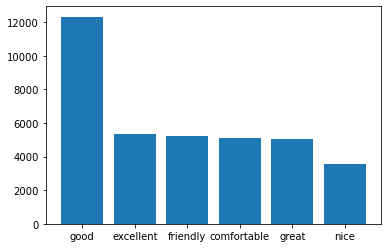

In [179]:
#Positive
#flatten out array
positive_res = {}
for item in positive_dict_list:
    positive_res.update(item)

positive_keys = [key for key in positive_res.keys()]
positive_values = [value for value in positive_res.values()]
plt.bar(positive_keys[:6], positive_values[:6])

<BarContainer object of 6 artists>

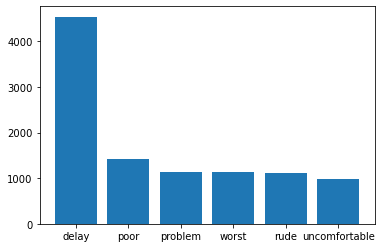

In [178]:
#Negative
#flatten out array
negative_res = {}
for item in negative_dict_list:
    negative_res.update(item)

#delayed is not in its root form and should be --> delay
delay_sum = negative_res.get('delayed') + negative_res.get('delay')
new_delay_dict = {"delay":delay_sum}
negative_res.update(new_delay_dict)
negative_res.pop('delayed')

negative_keys = [key for key in negative_res.keys()]
negative_values = [value for value in negative_res.values()]

plt.bar(negative_keys[:6], negative_values[:6])